<a href="https://colab.research.google.com/github/sushily1997/Restaurant_Cuisines_Classification-Multiclass_Cuisine-/blob/main/Multi_Class_Cuisine_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Restaurant Cuisines classification** 
### **Problem Statement:-**
Market contest and problem summary for restaurant records in the YELP business database, details on type of cuisine served are captured .When a cuisine type as not been captured for a particular restaurant , cuisine types are assigned best on key words in the business name ,this process was originally created on AS400 and recently migrated to BDBX .due to system limitations, The process only assigns 35 of the piece -100_ cuisine types   available in the YELP platform .in addition, these systems are only able to assign / stored one cuisine type per restaurant  where the YELP platform  allows the multiple .
### **STRATEGY:**
Expand the cuisine assignment process to consider all 100_ supported cuisine type and assign multiple cuisine types where applicable.
Value propositions:
Proper and granular categorization of businesses is critical to many clients the best way to appropriately categorize restaurants is by identifying the cuisines served at each location.
### **Expected Outcome:**
1-Updated keyword table 
2-Programatic assignment of all 100_cuisine types 
3-Programatic assignment of multiple cuisine types per restaurants.

HELP
NLP problem , Multilearn  ML SVC  KNN ,label powerset 1 virses rest classifier, Deep Nural networks, CNN, ANN, GloveLSTM ,RNN 

In [ ]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import re
import sys
import warnings
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

# let's parse the dates for dateAdded and dateUpdated
from datetime import datetime
from dateutil.parser import parse

!pip install fuzzywuzzy
from fuzzywuzzy import process, fuzz

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

from nltk.stem.snowball import SnowballStemmer

from wordcloud import WordCloud,STOPWORDS

from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, roc_auc_score, precision_score, recall_score

from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier

from sklearn.multioutput import MultiOutputClassifier
from sklearn.neighbors import KNeighborsClassifier

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras import backend as K

!pip install optimizers
from tensorflow.keras.optimizers import Adam # - Works

from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import tensorflow as tf
from keras.layers import Dense, Activation, Embedding, Flatten, GlobalMaxPool1D, Dropout, Conv1D, LSTM

from numpy import array, asarray, zeros
from keras.models import Model, Sequential, load_model
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Datafiniti_Fast_Food_Restaurants_May19.csv")


In [ ]:
df.head()

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,longitude,name,postalCode,province,sourceURLs,websites
0,AWrSh_KgsVYjT2BJAzaH,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"Fast Food Restaurants,Hamburgers and Hot Dogs,...",Accommodation & Food Services,Greeley,US,us/co/greeley/255511thavenue/554191587,40.39629,-104.69699,Carl's Jr.,80631,CO,https://www.yellowpages.com/greeley-co/mip/car...,https://www.carlsjr.com/?utm_source=Yextandutm...
1,AWEKlA-LIxWefVJwxG9B,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"Restaurant,Mexican Restaurants,Fast Food Resta...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/2513highway6and50/1550891556,39.08135,-108.58689,Del Taco,81505,CO,http://www.citysearch.com/profile/772076870/gr...,http://www.deltaco.com
2,AWrSfAcYsVYjT2BJAzPt,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"Sandwich Shops,Fast Food Restaurants,Restauran...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/1125pattersonroad/-2137447852,39.09148,-108.55411,Which Wich,81506,CO,https://www.yellowpages.com/grand-junction-co/...,http://www.whichwich.com
3,AWrSa3NAQTFama1Xpkbz,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Aurora,US,us/co/aurora/3455nsalidacourt/1143321601,39.76369,-104.77671,Chipotle Mexican Grill,80011,CO,https://www.yellowpages.com/aurora-co/mip/chip...,http://www.chipotle.com
4,AWrSaVGzZ4Yw-wtdgcaB,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Denver,US,us/co/denver/5225ecolfaxavenue/-864103396,39.74044,-104.92636,Taco Bell,80220,CO,https://www.yellowpages.com/denver-co/mip/taco...,https://locations.tacobell.com/co/denver/5225-...


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 10000 non-null  object 
 1   dateAdded          10000 non-null  object 
 2   dateUpdated        10000 non-null  object 
 3   address            10000 non-null  object 
 4   categories         10000 non-null  object 
 5   primaryCategories  10000 non-null  object 
 6   city               10000 non-null  object 
 7   country            10000 non-null  object 
 8   keys               10000 non-null  object 
 9   latitude           10000 non-null  float64
 10  longitude          10000 non-null  float64
 11  name               10000 non-null  object 
 12  postalCode         10000 non-null  object 
 13  province           10000 non-null  object 
 14  sourceURLs         10000 non-null  object 
 15  websites           9918 non-null   object 
dtypes: float64(2), object(1

In [ ]:
df.primaryCategories.value_counts()

Accommodation & Food Services    10000
Name: primaryCategories, dtype: int64

## **Let's drop id, keys, sourceURLs, and websites first**

In [ ]:
# the id, keys, sourceURLs, and websites are unique identifier
# we don't need them in our visualizations
df = df.drop(['id', 'keys', 'sourceURLs', 'websites'], axis=1)

# shape of dataset
print("Dimension after dropping columns:")
print(df.shape)

# take a peek at the head to verify the drop is successful
df.head()

Dimension after dropping columns:
(10000, 12)


,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,latitude,longitude,name,postalCode,province
0,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"Fast Food Restaurants,Hamburgers and Hot Dogs,...",Accommodation & Food Services,Greeley,US,40.39629,-104.69699,Carl's Jr.,80631,CO
1,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"Restaurant,Mexican Restaurants,Fast Food Resta...",Accommodation & Food Services,Grand Junction,US,39.08135,-108.58689,Del Taco,81505,CO
2,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"Sandwich Shops,Fast Food Restaurants,Restauran...",Accommodation & Food Services,Grand Junction,US,39.09148,-108.55411,Which Wich,81506,CO
3,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Aurora,US,39.76369,-104.77671,Chipotle Mexican Grill,80011,CO
4,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Denver,US,39.74044,-104.92636,Taco Bell,80220,CO


In [ ]:
# my personal reusable function for detecting missing data
def missing_value_describe(df):
    # check missing values in training data
    missing_value_stats = (df.isnull().sum() / len(df)*100)
    missing_value_col_count = sum(missing_value_stats > 0)
    missing_value_stats = missing_value_stats.sort_values(ascending=False)[:missing_value_col_count]
    print("Number of columns with missing values:", missing_value_col_count)
    if missing_value_col_count != 0:
        # print out column names with missing value percentage
        print("\nMissing percentage (desceding):")
        print(missing_value_stats)
    else:
        print("No misisng data!!!")
missing_value_describe(df)

Number of columns with missing values: 0
No misisng data!!!


###**Date data processing and visualizations**
Let's process the dateAdded and dateUpdate data

In [ ]:
# take a peek at the dateAdded column
df['dateAdded'].head()

0    2019-05-19T23:58:05Z
1    2018-01-18T18:30:23Z
2    2019-05-19T23:45:04Z
3    2019-05-19T23:26:58Z
4    2019-05-19T23:24:38Z
Name: dateAdded, dtype: object

They are string or not datetime object.
Let's convert them so we can access date and time easier

In [ ]:
# let's convert dateAdded and dateUpdated column data to 
# datetime object with apply function
df['dateAdded'] = df['dateAdded'].apply(
        lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ'))
df['dateUpdated'] = df['dateUpdated'].apply(
        lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ'))

In [ ]:
# check the top 6 rows again to verify the datatype has changed
print(df['dateAdded'].head())
print()
print(df['dateUpdated'].head())

0   2019-05-19 23:58:05
1   2018-01-18 18:30:23
2   2019-05-19 23:45:04
3   2019-05-19 23:26:58
4   2019-05-19 23:24:38
Name: dateAdded, dtype: datetime64[ns]

0   2019-05-19 23:58:05
1   2019-05-19 23:45:05
2   2019-05-19 23:45:04
3   2019-05-19 23:26:58
4   2019-05-19 23:24:38
Name: dateUpdated, dtype: datetime64[ns]


**When are the data recorded and updated**

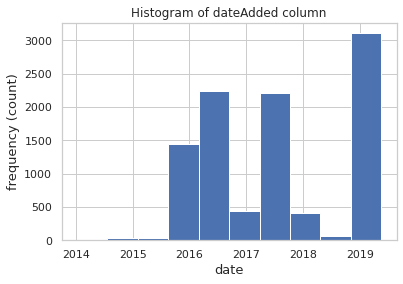

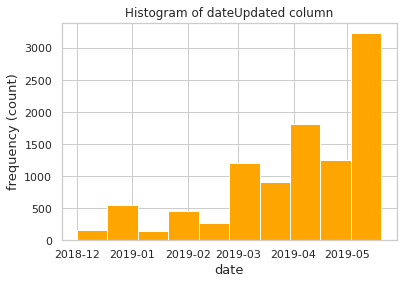

In [ ]:
# histogram of dateAdded column
plt.hist(df['dateAdded'])
plt.xlabel("date")
plt.ylabel("frequency (count)")
plt.title("Histogram of dateAdded column")
plt.show()

# histogram of dateUpdated column
plt.hist(df['dateUpdated'], color="orange")
plt.xlabel("date")
plt.ylabel("frequency (count)")
plt.title("Histogram of dateUpdated column")
plt.show()

From above combined histograms, we can observe:

1: Newly updated data are primary recorded in 2019.

2: Many data are originally recorded from 2014-2019.



In [ ]:
# we can see the data type changed for the date related columns
df.dtypes

dateAdded            datetime64[ns]
dateUpdated          datetime64[ns]
address                      object
categories                   object
primaryCategories            object
city                         object
country                      object
latitude                    float64
longitude                   float64
name                         object
postalCode                   object
province                     object
dtype: object

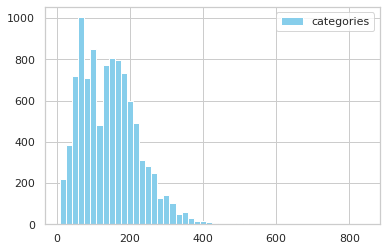

In [ ]:
length_data = df['categories'].str.len()
plt.hist(length_data, bins = 50, label = "categories", color= "skyblue")
plt.legend()
plt.show()

####**Let's explore the location data of given dataset**

###**What cities are crowded with fast food restaurants**

Number of unique cities: 2810


Text(0, 0.5, 'count')

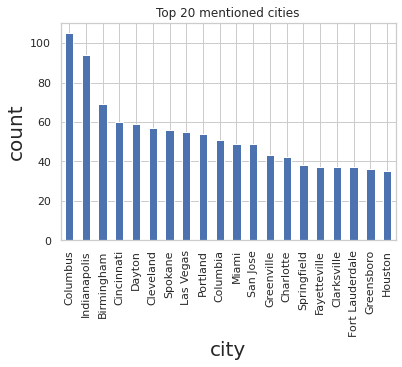

In [ ]:
# top 20 fast food populated cities recorded by count total
print("Number of unique cities:", df['city'].nunique())
nameplot = df['city'].value_counts()[:20].plot.bar(title='Top 20 mentioned cities')
nameplot.set_xlabel('city',size=20)
nameplot.set_ylabel('count',size=20)

let's run pandas' .descirbe() function to see the min, max, and mean of number of fast food restaurants in different cities

In [ ]:
# let's run pandas' .descirbe() function 
rest_count_by_city = df['city'].value_counts()
rest_count_by_city.describe()

count    2810.000000
mean        3.558719
std         6.260422
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max       105.000000
Name: city, dtype: float64


Many cities has only 1-3 restaurants opened and our mean number of restaurants opened is 3.55.

**How many are cities open less than 4 fast food restaurants in our dataset**

In [ ]:
print(len(rest_count_by_city[rest_count_by_city < 4]), "cities opened less than 4 fast food restaurants")
print("They are", round(100*len(rest_count_by_city[rest_count_by_city < 4])/len(rest_count_by_city),2), "%"),
print("of the total cities recorded in the dataset")

2121 cities opened less than 4 fast food restaurants
They are 75.48 %
of the total cities recorded in the dataset


**Let's present our finding with pie chart to show the percentage**

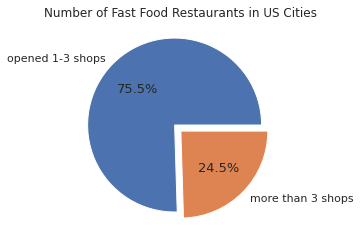

In [ ]:
# plot pie chart
fig, ax = plt.subplots()
total_cities_with_less_than_4_rests = len(rest_count_by_city[rest_count_by_city < 4])
total_cities_with_greater_equal_4_rests = df['city'].nunique() - total_cities_with_less_than_4_rests
values = [total_cities_with_less_than_4_rests, total_cities_with_greater_equal_4_rests]
ax.pie(values, 
       labels=["opened 1-3 shops", "more than 3 shops"], autopct='%.1f%%', radius=1, 
       explode = (0.1, 0))
ax.set_aspect('equal')
ax.set_title("Number of Fast Food Restaurants in US Cities")
plt.show()

From above pie-chart, we can see 75.5% of the cities in our dataset has only opened 1-3 fast food restaurants.

### **What are the proportions of different fast food restaurants in top 3 mentioned cities**

In [ ]:
# get top 3 fast food populated cities
top3_fastfood_populated_cities = df['city'].value_counts()[:3].index.tolist()
top3_fastfood_populated_cities[:3]

['Columbus', 'Indianapolis', 'Birmingham']

In [ ]:
# take a look at the restaurant numbers
df[df["city"]=="Columbus"]["name"].value_counts()

SUBWAY                               13
Subway                                8
McDonald's                            7
Pizza Hut                             6
Chipotle Mexican Grill                6
Panera Bread                          3
Domino's Pizza                        3
Dairy Queen                           3
Arby's                                2
Waffle House                          2
Bob Evans                             2
Wendy's                               2
WG Grinders                           2
Churchs Chicken                       2
Moe's Southwest Grill                 2
Panda Express                         2
McDonalds                             2
Jam Restaurants                       1
1 Gyro Shoppe                         1
Church's Chicken                      1
Hunan Lion Gourmet Chinese            1
Jerry's Subs and Pizza                1
Hunan House                           1
Jersey Mike's Subs                    1
Acropolis Gyro Palace                 1


A lot of restaurants only opened 1 shop. Let's take a look how many restaurants open more than 1 shop in the top 3 fast food populated cities

In [ ]:
# get the restaurant number count by unique restaurant name
def get_restaurants_counts(city_name):
    return df[df["city"]==city_name]["name"].value_counts()

# print the restaurants that opened more than 1 shop
def print_more_than_1_shop_rest(restaurants, city_name):
    more_than_1_shops = restaurants[restaurants > 1]
    print("\nAmong", len(restaurants), "unique fastfood restaurant brands in", city_name+",")
    print(len(more_than_1_shops), "brands opened more than 1 shops.")
    print("They occupied", str(round(len(more_than_1_shops)/sum(restaurants)*100,2))+
          "% of total restaurants by number")
    print(more_than_1_shops)

In [ ]:
# let's generate a quick summary of the shops
for city in top3_fastfood_populated_cities:
    print_more_than_1_shop_rest(get_restaurants_counts(city), city)


Among 55 unique fastfood restaurant brands in Columbus,
17 brands opened more than 1 shops.
They occupied 16.19% of total restaurants by number
SUBWAY                    13
Subway                     8
McDonald's                 7
Pizza Hut                  6
Chipotle Mexican Grill     6
Panera Bread               3
Domino's Pizza             3
Dairy Queen                3
Arby's                     2
Waffle House               2
Bob Evans                  2
Wendy's                    2
WG Grinders                2
Churchs Chicken            2
Moe's Southwest Grill      2
Panda Express              2
McDonalds                  2
Name: name, dtype: int64

Among 53 unique fastfood restaurant brands in Indianapolis,
19 brands opened more than 1 shops.
They occupied 20.21% of total restaurants by number
Pizza Hut                  8
Dairy Queen                6
SUBWAY                     5
Jimmy John's               4
Steak 'n Shake             4
Church's Chicken           4
Domino's Pizza

From above quick summaries, many fast food restaurants actually have opened 1 shop in the top 3 fast food populated cities: 14.29%, 22.34%, and 20.25% of total fast food restaurants number in Columbus, Indianapolis, and Birmingham respectively.

In each city, let's consider the top 10 restaurants as population and plot the percentage of appearance of each top 10 restaurants with pie chart.

In [ ]:
# reusable function to create data needed for plotting pie chart
def create_pie_chart_data(city_name):
    counts =  df[df["city"]==city_name]["name"].value_counts()[:10].values
    labels = df[df["city"]==city_name]["name"].value_counts().index.tolist()[:10]
    return counts, labels

In [ ]:
# reusable function to plot pie chart for our EDA
def plot_pie_chart(counts, labels, city_name):
    fig, ax = plt.subplots()
    ax.pie(counts, labels=labels, autopct='%.1f%%', radius=1.1, 
          explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0))
    ax.set_aspect('equal')
    ax.set_title("Top 10 Restaurants in " + city_name)
    plt.show()

['SUBWAY', 'Subway', "McDonald's"] are the top 3 populated restaurants in Columbus


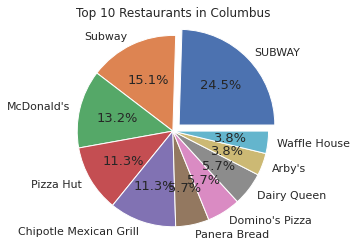

['Pizza Hut', 'Dairy Queen', 'SUBWAY'] are the top 3 populated restaurants in Indianapolis


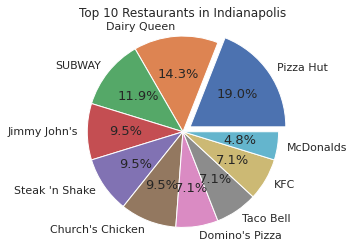

["McDonald's", 'Subway', "Jimmy John's"] are the top 3 populated restaurants in Birmingham


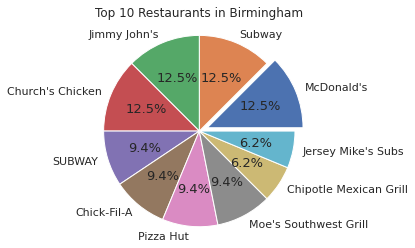

In [ ]:
# for each city, let's create the data needed and plot them in pie chart
for city in top3_fastfood_populated_cities:
    counts, labels = create_pie_chart_data(city)
    print(labels[:3], "are the top 3 populated restaurants in", city)
    plot_pie_chart(counts, labels, city)

### **Provinces with most number of top restaurants**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   dateAdded          10000 non-null  datetime64[ns]
 1   dateUpdated        10000 non-null  datetime64[ns]
 2   address            10000 non-null  object        
 3   categories         10000 non-null  object        
 4   primaryCategories  10000 non-null  object        
 5   city               10000 non-null  object        
 6   country            10000 non-null  object        
 7   latitude           10000 non-null  float64       
 8   longitude          10000 non-null  float64       
 9   name               10000 non-null  object        
 10  postalCode         10000 non-null  object        
 11  province           10000 non-null  object        
dtypes: datetime64[ns](2), float64(2), object(8)
memory usage: 937.6+ KB


In [ ]:
sorted(df.name.unique())


["1 Frisch's Big Boy Restaurant",
 '1 Gyro Shoppe',
 '143 Street Tacos',
 '2 Bits Cafe',
 "40 Frisch's Big Boy Restaurant",
 '5 Star Abq',
 '5th Street Diner',
 "90 Frisch's Big Boy Restaurant",
 '900 Degrees Pizza',
 '919 Dine',
 'A W Restaurant',
 'ABC Chinese Restaurant',
 'AW',
 'AW All-American Food',
 'AW Restaurant',
 'AW Restaurants',
 'AWRestaurants',
 "Abby's Legendary Pizza",
 'Abbys Restaurant Bar',
 'Acai Alaska',
 'Acropolis Gyro Palace',
 "Adalberto's Mexican Food",
 'Adams Enterprises',
 'Afternoon Deli',
 'Agate Alley Bistro',
 'Ak Buffet',
 "Al's Burger Shack",
 "Al's Burger Shack-Southern Village",
 "Albee's NY Gyros",
 "Albee's Ny Gyros",
 'Alberte Restaurant With A Carribean Flavor',
 'Ale House 1890',
 "Alfonso's Pizza Italian Restaurant",
 'Alfonsos Pizza',
 'All About Burger',
 'Alpine Bistro Bakery Co',
 'Amigos-Kings Classic',
 'Andreas Keller Restaurant',
 "Andy's Frozen Custard",
 'Andys Burgers Shakes Fries',
 'Anf Gyros Grill',
 'Angelinas Pizza',
 'Angry 

In [ ]:
df['name'] = df['name'].apply(lambda x : x.lower().strip())


In [ ]:
unique_names = sorted(df.name.unique())

####**Brands with most restaurant chains**

In [ ]:
restaurants_counts = df.name.value_counts()
restaurants_counts = restaurants_counts[restaurants_counts>250]
restaurants_list = list(restaurants_counts.index)
restaurants_list

['subway',
 "mcdonald's",
 'taco bell',
 'pizza hut',
 'burger king',
 'kfc',
 'sonic drive-in',
 'dairy queen']

####**Creating an Independent Function for replacement of the matches in the data.**

In [ ]:
!pip install fuzzywuzzy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from fuzzywuzzy import process, fuzz

def replace_name(df, column_name, brand, threshold_ratio = 90):
    query = df[column_name].unique()
    results = process.extract(brand, query, limit=10, scorer=fuzz.token_sort_ratio)
    string_matches = [results[0] for results in results if results[1] >= threshold_ratio]
    rows_with_matches = df[column_name].isin(string_matches) 
    df.loc[rows_with_matches, column_name] = brand
    return df.copy()

####**Tokens**

In [ ]:
similar_name_list = list()
for restuarant in restaurants_list:
    query = df['name'].unique()
    results = process.extract(restuarant, query, limit=9, scorer=fuzz.token_sort_ratio)
    similar_name_list.append(results)
similar_name_list

##Check the token_sort_ratio upto the closed value.
#subway - 100
#mcdonald's - 100
#pizza hut - 100

[[('subway', 100),
  ('moz subway', 75),
  ('desert subway', 63),
  ('subway 16 mile', 60),
  ('subway restaurant', 52),
  ('subway sandwiches', 52),
  ('sbarro', 50),
  ("wendy's", 46),
  ('fundays', 46)],
 [("mcdonald's", 100),
  ('mcdonalds', 95),
  ("mc donald's", 76),
  ("mcdonald's - closed", 74),
  ("dolly's cafe", 55),
  ('mcdonalds family restaurant', 54),
  ("carl's jr.", 53),
  ('china sea', 53),
  ("carl's jr", 53)],
 [('taco bell', 100),
  ('del taco', 82),
  ('taco bueno', 74),
  ('taco box', 71),
  ("bellacino's", 70),
  ('taco del mar', 67),
  ('killer tacos', 67),
  ('bella bistro', 67),
  ('el tapatio', 63)],
 [('pizza hut', 100),
  ('beach pizza', 70),
  ('pizza hut express', 69),
  ('key pizza', 67),
  ('boston pizza', 67),
  ('zpizza', 67),
  ('mod pizza', 67),
  ('pizza cottage', 64),
  ('pietros pizza', 64)],
 [('burger king', 100),
  ('burger king®', 100),
  ('burgers inc', 82),
  ('giant burger', 78),
  ('burger king - closed', 76),
  ('burger kingpopeyes', 76)

In [ ]:
tokens = [100, 75, 100, 63, 60, 52, 52, 50]
for token, restuarant in zip(tokens, restaurants_list):
    replace_name(df,'name',restuarant, token)

In [ ]:
df = replace_name(df,'name','kentucky fried chicken', 90)
df.loc[df.name.str.startswith('kentucky fried chicken'), 'name'] = 'kfc'

In [ ]:
sorted(df.name.unique())

["1 frisch's big boy restaurant",
 '1 gyro shoppe',
 '143 street tacos',
 '2 bits cafe',
 "40 frisch's big boy restaurant",
 '5 star abq',
 '5th street diner',
 "90 frisch's big boy restaurant",
 '900 degrees pizza',
 '919 dine',
 'a w restaurant',
 "abby's legendary pizza",
 'abbys restaurant bar',
 'abc chinese restaurant',
 'acai alaska',
 'acropolis gyro palace',
 "adalberto's mexican food",
 'adams enterprises',
 'afternoon deli',
 'agate alley bistro',
 'ak buffet',
 "al's burger shack",
 "al's burger shack-southern village",
 "albee's ny gyros",
 'alberte restaurant with a carribean flavor',
 'ale house 1890',
 "alfonso's pizza italian restaurant",
 'alfonsos pizza',
 'all about burger',
 'alpine bistro bakery co',
 'amigos-kings classic',
 'andreas keller restaurant',
 "andy's frozen custard",
 'andys burgers shakes fries',
 'anf gyros grill',
 'angelinas pizza',
 'angry barbeque',
 "ann tony's restaurant",
 'annas pizza italian restaurant',
 "annie's cambodian cuisine",
 'apol

In [ ]:
data_top = df[df.name.isin(restaurants_list)]


In [ ]:
data_top.name.value_counts()

subway            1210
mcdonald's         921
taco bell          529
pizza hut          483
burger king        462
kfc                444
sonic drive-in     331
dairy queen        330
Name: name, dtype: int64

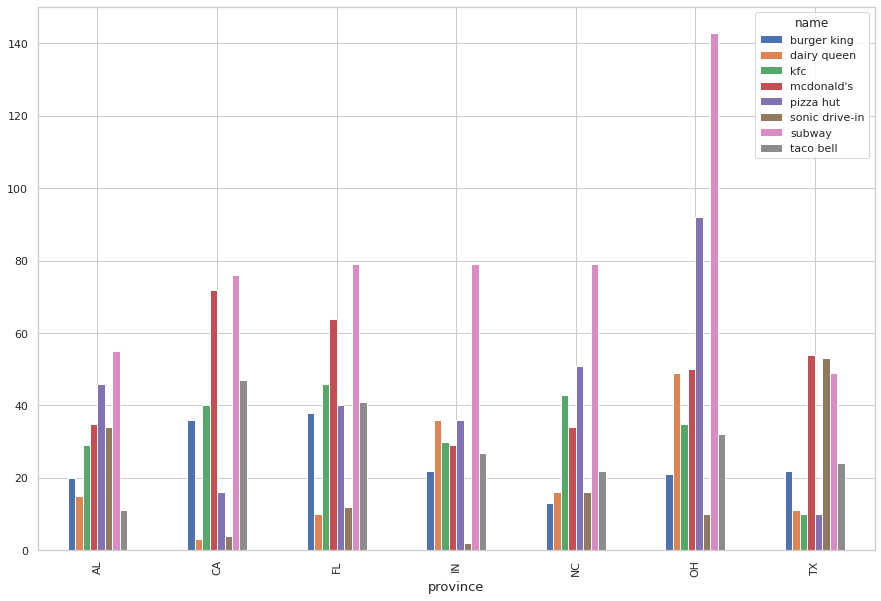

In [ ]:
%matplotlib inline
data_top_province = data_top.province.value_counts()
data_top_province_list = list(data_top_province[data_top_province>200].index)
data_top_province_top = data_top[data_top.province.isin(data_top_province_list)]
data_top_province_top_group = data_top_province_top.groupby(['province','name'])
data_top_province_top_group.size().unstack().plot(kind ='bar', figsize =(15,10))

From above plot, the interactive visualization shows Ohio(OH), Florida(FL), California(CA), and North Carolina(NC) etc, which indicated there are Provinces with most number of top restaurants opened in those states than the others.

## **Mapping of Restaurnts on the Map**

In [ ]:
address = 'United States'

geolocator = Nominatim(user_agent="tr_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of America City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of America City are 39.7837304, -100.445882.


### **How are the fast food restaurants scattered**

In [ ]:
# create map of Toronto using latitude and longitude values
map_bng = folium.Map(location=[latitude, longitude], zoom_start=4)

# add markers to map
for lat, lng, name, city in zip(df['latitude'], df['longitude'], df['name'], df['city']):
    label = '{}, {}'.format(city, name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bng)  
    
map_bng

If you take a look at the above scatter plot, you can see most of fast food restaurants are located in very populated cities and borders of several states.

##**NLP: More data cleaning is needed!!!**
We can see there are "McDonald's" and "McDonalds" and "Subway" and "SUBWAY"

Let's apply NLTK's edit distance function to find the edit distance between those names

**Edit Distance:** The distance between the source string and the target string is the minimum number of edit operations (deletions, insertions, or substitutions) required to transform the source into the target. The lower the distance, the more similar the two strings.

uncomment if you want to run the edit-distance similarity checking.

Due the reason of time-consuming, we commented out the code.

In [ ]:
# # obtained unique names of restaurants
# restaurant_names = df['name'].unique()

# # calculate similarity and record most-similar names together
# most_similar = []
# for i in range(len(restaurant_names)):
#     # temporary list to store the current similar words
#     temp_similar = [restaurant_names[i]]
    
#     # compare and save similar words
#     for j in range(len(restaurant_names)):
#         if restaurant_names[i] == restaurant_names[j]:
#             continue
#         if nltk.edit_distance(restaurant_names[i].lower(), restaurant_names[j].lower()) < 3:
#             temp_similar.append(restaurant_names[j])
            
#     # similar word(s) found
#     if len(temp_similar) > 1:
#         most_similar.append(temp_similar)
#     if i > 0 and i % 10 == 0:
#         print("index", i-10, "-", i, "checking finished| most similar size:", len(most_similar))
# print("similarity checking finished")

# # count number of similar words
# most_similar_word_count = 0
# for i in most_similar:
#     most_similar_word_count += len(i)
# print("size of the most similar list:", most_similar_word_count)
# most_similar

In [ ]:
# let's remove the exceptions from the above most_similar's list
# since the list is small and we only need to do some minor changes, I will just do it manually
# to avoid running edit-distance again
most_similar_edited = [["Carl's Jr.", "Carl's Jr", 'Carls Jr'],
 ["McDonald's", "Mc Donald's", 'Mcdonalds', 'McDonalds'],
 ['Cook-Out', 'Cook Out', 'CookOut'],
 ["Steak 'n Shake",
  "STEAK 'N SHAKE",
  'Steak N Shake',
  'Steak n Shake',
  "Steak 'N Shake"],
 ['QDOBA Mexican Eats', 'Qdoba Mexican Eats'],
 ['Burger King', 'Burger King®'],
 ["Hardee's", 'Hardees'],
 ['Taco Time', 'TacoTime'],
 ["Arby's", 'Arbys'],
 ['Chick-fil-A', 'Chick-Fil-A', 'ChickfilA'],
 ['Subway', 'SUBWAY'],
 ['Kfc', 'KFC'],
 ["Jack's", 'Jacks'],
 ['Sonic Drive-In',
  'SONIC Drive-In',
  'SONIC Drive In',
  'Sonic DriveIn',
  'Sonic Drive-in'],
 ["Church's Chicken", 'Churchs Chicken'],
 ['Big Boys', 'Big Boy'],
 ['Dairy Queen', 'Dairy queen'],
 ['Guthries', "Guthrie's"],
 ['Chick-Fil-A', 'Chick-fil-A', 'ChickfilA'],
 ["Wendy's", 'Wendys'],
 ["Jimmy John's", 'Jimmy Johns'],
 ['Dairy Queen Grill Chill', 'Dairy Queen Grill & Chill'],
 ["Moe's Southwest Grill", 'Moes Southwest Grill'],
 ["Domino's Pizza", 'Dominos Pizza'],
 ["Rally's", 'Rallys'],
 ['Full Moon Bar-B-Que', 'Full Moon Bar B Que'],
 ["Guthrie's", 'Guthries'],
 ["McAlister's Deli", "Mcalister's Deli", 'McAlisters Deli'],
 ["Jason's Deli", 'Jasons Deli'],
 ['KFC', 'Kfc', 'KFC Kentucky Fried Chicken', 'KFC - Kentucky Fried Chicken'],
 ['Popeyes Louisiana Kitchen', "Popeye's Louisiana Kitchen"],
 ["Long John Silver's", 'Long John Silvers'],
 ['BLIMPIE', 'Blimpie'],
 ['Five Guys Burgers Fries', 'Five Guys Burgers & Fries'],
 ['SUBWAY', 'Subway'],
 ['Dairy Queen Grill & Chill', 'Dairy Queen Grill Chill'],
 ['Potbelly Sandwich Works', 'Pot Belly Sandwich Works'],
 ["Charley's Grilled Subs", 'Charleys Grilled Subs'],
 ["Jersey Mike's Subs", 'Jersey Mikes Subs'],
 ['In-N-Out Burger', 'InNOut Burger'],
 ["Culver's", "CULVER'S", 'Culvers'],
 ["Famous Dave's", 'Famous Daves'],
 ["Freddy's Frozen Custard Steakburgers",
  'Freddys Frozen Custard Steakburgers',
  "Freddy's Frozen Custard & Steakburgers"],
 ['Cook Out', 'Cook-Out', 'CookOut'],
 ['TacoTime', 'Taco Time'],
 ['Hooters', 'Roosters'],
 ['BurgerFi', 'Burgerfi'],
 ["Chen's Restaurant", "Chan's Restaurant"],
 ['Taco Del Mar', 'Taco del Mar'],
 ['SONIC Drive-In',
  'Sonic Drive-In',
  'SONIC Drive In',
  'Sonic DriveIn',
  'Sonic Drive-in'],
 ['Ciscos Taqueria', "Cisco's Taqueria"],
 ['China King', 'China Lin'],
 ["Bojangles' Famous Chicken 'n Biscuits",
  'Bojangles Famous Chicken n Biscuits'],
 ["Dominic's of New York", 'Dominics of New York'],
 ["Papa John's Pizza", 'Papa Johns Pizza'],
 ['Chanellos Pizza', 'Chanello’s Pizza'],
 ["Fazoli's", 'Fazolis'],
 ['Wing Street', 'Wingstreet'],
 ["George's Gyros Spot", "George's Gyros Spot 2"],
 ['Taco Johns', "Taco John's"],
 ['RUNZA', 'Runza'],
 ['Bru Burger Bar', 'Grub Burger Bar'],
 ["Taco John's", 'Taco Johns'],
 ["Bob's Burger Brew", "Bob's Burgers Brew", "Bob's Burgers Brew", "Bob's Burger Brew"],
 ['Best Burgers', 'Best Burger'],
 ['Burgermaster', 'Burger Master'],
 ["Dick's Drive-In", "DK's Drive-In"],
 ["Charley's Grill Spirits", "Charley's Grill & Spirits"],
 ['Tom Drive-in', "Tom's Drive-In"],
 ["Fox's Pizza Den", 'Foxs Pizza Den'],
 ["Mc Donald's", "McDonald's", 'Mcdonalds', 'McDonalds'],
 ['Taco CASA', 'Taco Casa'],
 ["Mcalister's Deli", "McAlister's Deli", 'McAlisters Deli'],
 ['Saras Too', "Sara's Too"],
 ['Backyard Burgers', 'Back Yard Burgers'],
 ["CULVER'S", "Culver's", 'Culvers'],
 ["Simple Simon's Pizza", 'Simple Simons Pizza'],
 ['China Sea', 'China Star', 'China Bear'],
 ["Dino's Drive In", "Dan's Drive In"],
 ["STEAK 'N SHAKE",
  "Steak 'n Shake",
  'Steak N Shake',
  'Steak n Shake',
  "Steak 'N Shake"],
 ['Stanfields Steak House', "Stanfield's Steakhouse"],
 ['Wingstreet', 'Wing Street'],
 ["Big Billy's Burger Joint", 'Big Billys Burger Joint'],
 ['Big Boy', 'Big Boys'],
 ["Frisch's Big Boy Restaurant", "1 Frisch's Big Boy Restaurant", 
  "40 Frisch's Big Boy Restaurant", "1 Frisch's Big Boy Restaurant",
  "90 Frisch's Big Boy Restaurant"],
 ['Fireplace Restaurant Lounge', 'Fireplace Restaurant & Lounge'],
 ["Carl's Jr", "Carl's Jr.", 'Carls Jr'],
 ["Rick's on the River", 'Ricks on the River'],
 ['Grub Burger Bar', 'Bru Burger Bar'],
 ["Franky's", "Grandy's"],
 ['Gyro X-Press', 'Gyro Express'],
 ['Dominos Pizza', "Domino's Pizza"],
 ["Pietro's Pizza Gallery of Games", "Pietro's Pizza & Gallery of Games"],
 ['Burrtio Amigos', 'Burrito Amigos'],
 ["Albee's Ny Gyros", "Albee's NY Gyros"],
 ['Gyro Stop', 'Gyro Spot'],
 ['Nicholas Restaurant', "Nicholas' Restaurant"],
 ['Mcdonalds', "McDonald's", "Mc Donald's", 'McDonalds'],
 ['Burgerfi', 'BurgerFi'],
 ["Ryan's", 'Ryans'],
 ['Taste of Buffalo Pizzeria', 'Taste Of Buffalo Pizzeria'],
 ['Bad Daddys Burger Bar', "Bad Daddy's Burger Bar"],
 ["Zaxby's", "Arby's"],
 ["Topper's Pizza", 'Toppers Pizza'],
 ['C J Drive In', 'C & J Drive In'],
 ['Full Moon Bar B Que', 'Full Moon Bar-B-Que'],
 ['China Lin', 'China King'],
 ["Raising Cane's Chicken Fingers", 'Raising Canes Chicken Fingers'],
 ["Mary's Pizza Shack", 'Marys Pizza Shack'],
 ['Peking Chinese Restaurants', 'Peking Chinese Restaurant'],
 ['Arbys', "Arby's"],
 ['SONIC Drive In',
  'Sonic Drive-In',
  'SONIC Drive-In',
  'Sonic DriveIn',
  'Sonic Drive-in'],
 ['Hardees', "Hardee's"],
 ['McDonalds', "McDonald's", "Mc Donald's", 'Mcdonalds'],
 ['Wendys', "Wendy's"],
 ['Papa Johns Pizza', "Papa John's Pizza"],
 ["George's Gyros Spot 2", "George's Gyros Spot"],
 ['ChickfilA', 'Chick-fil-A', 'Chick-Fil-A'],
 ['Rallys', "Rally's"],
 ['C & J Drive In', 'C J Drive In'],
 ['Steak N Shake',
  "Steak 'n Shake",
  "STEAK 'N SHAKE",
  'Steak n Shake',
  "Steak 'N Shake"],
 ["Popeye's Louisiana Kitchen", 'Popeyes Louisiana Kitchen'],
 ["DJ's Drive-In", "DK's Drive-In"],
 ["Dan's Drive In", "Dino's Drive In"],
 ['Best Burger', 'Best Burgers', 'Beef Burger'],
 ['Jimmy Johns', "Jimmy John's"],
 ['BaskinRobbins', 'Baskin-Robbins', 'Baskin Robbins'],
 ['Carls Jr', "Carl's Jr.", "Carl's Jr"],
 ['WG Grinders', 'Wg Grinders'],
 ['McAlisters Deli', "McAlister's Deli", "Mcalister's Deli"],
 ['Fazolis', "Fazoli's"],
 ['Marys Pizza Shack', "Mary's Pizza Shack"],
 ['Bojangles Famous Chicken n Biscuits',
  "Bojangles' Famous Chicken 'n Biscuits"],
 ['Jacks', "Jack's"],
 ["Hardee's/red Burrito", 'Hardees Red Burrito', "Hardee's/Red Burrito"],
 ['Captain Ds', "Captain D'S"],
 ['Mr Hero', 'Mr. Hero'],
 ["Chan's Restaurant", "Chen's Restaurant"],
 ['Ritters Frozen Custard', "Ritter's Frozen Custard"],
 ['Hot Dog on a Stick', 'Hot Dog On A Stick'],
 ['Jersey Mikes Subs', "Jersey Mike's Subs"],
 ['AW Restaurants',
  'Aw Restaurants',
  'AWRestaurants',
  'A W Restaurant',
  'AW Restaurant',
  'Jam Restaurants'],
 ['Long John Silvers', "Long John Silver's"],
 ["Rally's Hamburgers", 'Rallys Hamburgers'],
 ['HomeTown Buffet', 'Hometown Buffet'],
 ['Back Yard Burgers', 'Backyard Burgers'],
 ['Hardees Red Burrito', "Hardee's/red Burrito", "Hardee's/Red Burrito"],
 ["DK's Drive-In", "Dick's Drive-In", "DJ's Drive-In", "K's Drive In"],
 ['Baskin-Robbins', 'BaskinRobbins', 'Baskin Robbins'],
 ['Churchs Chicken', "Church's Chicken"],
 ['Blimpie', 'BLIMPIE'],
 ['Foxs Pizza Den', "Fox's Pizza Den"],
 ['Steak n Shake',
  "Steak 'n Shake",
  "STEAK 'N SHAKE",
  'Steak N Shake',
  "Steak 'N Shake"],
 ['Rallys Hamburgers', "Rally's Hamburgers"],
 ['Sonic DriveIn',
  'Sonic Drive-In',
  'SONIC Drive-In',
  'SONIC Drive In',
  'Sonic Drive-in'],
 ['Famous Daves', "Famous Dave's"],
 ['Beef Burger', 'Best Burger'],
 ['Dominics of New York', "Dominic's of New York"],
 ['Z-Pizza', 'zpizza'],
 ['KFC - Kentucky Fried Chicken', 'KFC Kentucky Fried Chicken'],
 ["Rockne's", 'Rocknes'],
 ["Hardee's/Red Burrito", "Hardee's/red Burrito", 'Hardees Red Burrito'],
 ['Aw Restaurants',
  'AW Restaurants',
  'AWRestaurants',
  'A W Restaurant',
  'AW Restaurant',
  'Jam Restaurants'],
 ['AWRestaurants', 'AW Restaurants', 'Aw Restaurants', 'AW Restaurant'],
 ["Hardee's Restaurant", "Hardee's Restaurants"],
 ["Hardee's Restaurants", "Hardee's Restaurant"],
 ["Stanfield's Steakhouse", 'Stanfields Steak House'],
 ['Dunkin Donuts', "Dunkin' Donuts"],
 ['Einstein Bros. Bagels', 'Einstein Bros Bagels'],
 ['Simple Simons Pizza', "Simple Simon's Pizza"],
 ['A W Restaurant', 'AW Restaurants', 'Aw Restaurants', 'AW Restaurant'],
 ['Einstein Bros Bagels', 'Einstein Bros. Bagels'],
 ['Roosters', 'Hooters'],
 ['Culvers', "Culver's", "CULVER'S"],
 ['Slice of Life', 'Slice Of Life'],
 ['Jasons Deli', "Jason's Deli"],
 ['Wg Grinders', 'WG Grinders'],
 ['Charleys Grilled Subs', "Charley's Grilled Subs"],
 ['Freddys Frozen Custard Steakburgers',
  "Freddy's Frozen Custard Steakburgers"],
 ['Moes Southwest Grill', "Moe's Southwest Grill"],
 ['CookOut', 'Cook-Out', 'Cook Out'],
 ['Peking Chinese Restaurant', 'Peking Chinese Restaurants'],
 ['InNOut Burger', 'In-N-Out Burger'],
 ["Nicholas' Restaurant", 'Nicholas Restaurant'],
 ['Chanello’s Pizza', 'Chanellos Pizza'],
 ['Ryans', "Ryan's"],
 ['Burger King®', 'Burger King'],
 ['Toppers Pizza', "Topper's Pizza"],
 ["Albee's NY Gyros", "Albee's Ny Gyros"],
 ['Qdoba Mexican Eats', 'QDOBA Mexican Eats'],
 ['Runza', 'RUNZA'],
 ['Slice Of Life', 'Slice of Life'],
 ['Mai-Tai Restaurant', 'Mai Tai Restaurant'],
 ['Gyro Express', 'Gyro X-Press'],
 ['zpizza', 'Z-Pizza'],
 ['Raising Canes Chicken Fingers', "Raising Cane's Chicken Fingers"],
 ['Rocknes', "Rockne's"],
 ['LL Hawaiian Barbecue', 'L L Hawaiian Barbecue', 'L L Hawaiian Barbeque'],
 ['Dairy queen', 'Dairy Queen'],
 ['Blakes Lotaburger', "Blake's Lotaburger"],
 ['Emidio & Sons Italian Restaurant', 'Emidio Sons Italian Restaurant'],
 ['Taste Of Buffalo Pizzeria', 'Taste of Buffalo Pizzeria'],
 ['L L Hawaiian Barbecue',
  'LL Hawaiian Barbecue',
  'L L Hawaiian Barbeque',
  'L & L Hawaiian Barbecue'],
 ['Killer Burgers', 'Killer Burger'],
 ["Steak 'N Shake",
  "Steak 'n Shake",
  "STEAK 'N SHAKE",
  'Steak N Shake',
  'Steak n Shake'],
 ['Burrito Amigos', 'Burrtio Amigos'],
 ["Zack's Hamburgers", "Jack's Hamburgers"],
 ['AW Restaurant',
  'AW Restaurants',
  'Aw Restaurants',
  'AWRestaurants',
  'A W Restaurant'],
 ['Jam Restaurants', 'AW Restaurants', 'Aw Restaurants'],
 ['Big Billys Burger Joint', "Big Billy's Burger Joint"],
 ['L L Hawaiian Barbeque', 'LL Hawaiian Barbecue', 'L L Hawaiian Barbecue'],
 ["Ritter's Frozen Custard", 'Ritters Frozen Custard'],
 ["Pietro's Pizza & Gallery of Games", "Pietro's Pizza Gallery of Games"],
 ["K's Drive In", "DK's Drive-In"],
 ['Killer Burger', 'Killer Burgers'],
 ["Dunkin' Donuts", 'Dunkin Donuts'],
 ['Farlows on the Water', "Farlow's On The Water"],
 ['Hometown Buffet', 'HomeTown Buffet'],
 ["Blake's Lotaburger", 'Blakes Lotaburger'],
 ["Jack's Hamburgers", "Zack's Hamburgers"],
 ["Cisco's Taqueria", 'Ciscos Taqueria'],
 ["Grandy's", "Franky's"],
 ["Farlow's On The Water", 'Farlows on the Water'],
 ["Bad Daddy's Burger Bar", 'Bad Daddys Burger Bar'],
 ['Baskin Robbins', 'BaskinRobbins', 'Baskin-Robbins'],
 ["Sara's Too", 'Saras Too'],
 ['T & L Hotdogs', 'T & L Hot Dogs'],
 ["Tom's Drive-In", 'Tom Drive-in'],
 ['Sonic Drive-in',
  'Sonic Drive-In',
  'SONIC Drive-In',
  'SONIC Drive In',
  'Sonic DriveIn'],
 ['Taco Casa', 'Taco CASA'],
 ['Emidio Sons Italian Restaurant', 'Emidio & Sons Italian Restaurant'],
 ['Fireplace Restaurant & Lounge', 'Fireplace Restaurant Lounge'],
 ['Mai Tai Restaurant', 'Mai-Tai Restaurant'],
 ['Ricks on the River', "Rick's on the River"],
 ['Taco del Mar', 'Taco Del Mar'],
 ['Five Guys Burgers & Fries', 'Five Guys Burgers Fries'],
 ['Mr. Hero', 'Mr Hero'],
 ["Captain D'S", 'Captain Ds'],
 ['Gyro Spot', 'Gyro Stop'],
 ["Charley's Grill & Spirits", "Charley's Grill Spirits"],
 ['Hot Dog On A Stick', 'Hot Dog on a Stick'],
 ['L & L Hawaiian Barbecue', 'L L Hawaiian Barbecue'],
 ['Pot Belly Sandwich Works', 'Potbelly Sandwich Works'],
 ['Burger Master', 'Burgermaster'],
 ["Freddy's Frozen Custard & Steakburgers",
  "Freddy's Frozen Custard Steakburgers"]]

In [ ]:
## let's sort them by the first element of each sublist
#def sortFirst(val): 
#    return val[0]  

## sorts the array in ascending according to 1st element 
#most_similar_edited.sort(key = sortFirst)  
#most_similar_edited

In [ ]:
# let's process the data second time manually to make the data cleaner
most_similar_sorted = [
 ['AW Restaurant', 'AW Restaurants', 'Aw Restaurants', 'A W Restaurant', 'AWRestaurants'],
 ["Albee's NY Gyros", "Albee's Ny Gyros"],
 ["Arby's", 'Arbys'],
 ['BLIMPIE', 'Blimpie'],
 ['Back Yard Burgers', 'Backyard Burgers'],
 ["Bad Daddy's Burger Bar", 'Bad Daddys Burger Bar'],
 ['Baskin Robbins', 'BaskinRobbins', 'Baskin-Robbins'],
 ['Best Burgers', 'Best Burger'],
 ["Big Billy's Burger Joint", 'Big Billys Burger Joint'],
 ['Big Boy', 'Big Boys'],
 ["Blake's Lotaburger", 'Blakes Lotaburger'],
 ['Blimpie', 'BLIMPIE'],
 ["Bob's Burger Brew",
  "Bob's Burgers Brew"],
 ['Bojangles Famous Chicken n Biscuits',
  "Bojangles' Famous Chicken 'n Biscuits"],
 ['Burger King', 'Burger King®'],
 ['Burger Master', 'Burgermaster'],
 ['BurgerFi', 'Burgerfi'],
 ['Burgermaster', 'Burger Master'],
 ['Burrito Amigos', 'Burrtio Amigos'],
 ['C & J Drive In', 'C J Drive In'],
 ["CULVER'S", "Culver's", 'Culvers'],
 ["Captain D'S", 'Captain Ds'],
 ["Carl's Jr", "Carl's Jr.", 'Carls Jr'],
 ["Chan's Restaurant", "Chen's Restaurant"],
 ['Chanellos Pizza', 'Chanello’s Pizza'],
 ["Charley's Grill & Spirits", "Charley's Grill Spirits"],
 ["Charley's Grilled Subs", 'Charleys Grilled Subs'],
 ["Chen's Restaurant", "Chan's Restaurant"],
 ['Chick-Fil-A', 'Chick-fil-A', 'ChickfilA'],
 ['China Sea', 'China Star', 'China Bear'],
 ["Church's Chicken", 'Churchs Chicken'],
 ["Cisco's Taqueria", 'Ciscos Taqueria'],
 ['Cook Out', 'Cook-Out', 'CookOut'],
 ["Culver's", "CULVER'S", 'Culvers'],
 ['Dairy Queen', 'Dairy queen'],
 ['Dairy Queen Grill & Chill', 'Dairy Queen Grill Chill'],
 ["Dominic's of New York", 'Dominics of New York'],
 ["Domino's Pizza", 'Dominos Pizza'],
 ['Dunkin Donuts', "Dunkin' Donuts"],
 ['Einstein Bros Bagels', 'Einstein Bros. Bagels'],
 ['Emidio & Sons Italian Restaurant', 'Emidio Sons Italian Restaurant'],
 ["Famous Dave's", 'Famous Daves'],
 ["Farlow's On The Water", 'Farlows on the Water'],
 ["Fazoli's", 'Fazolis'],
 ['Fireplace Restaurant & Lounge', 'Fireplace Restaurant Lounge'],
 ['Five Guys Burgers & Fries', 'Five Guys Burgers Fries'],
 ["Fox's Pizza Den", 'Foxs Pizza Den'],
 ["Freddy's Frozen Custard & Steakburgers",
  'Freddys Frozen Custard Steakburgers',
  "Freddy's Frozen Custard Steakburgers"],
 ["Frisch's Big Boy Restaurant",
  "1 Frisch's Big Boy Restaurant",
  "40 Frisch's Big Boy Restaurant",
  "1 Frisch's Big Boy Restaurant",
  "90 Frisch's Big Boy Restaurant"],
 ['Full Moon Bar B Que', 'Full Moon Bar-B-Que'],
 ["George's Gyros Spot", "George's Gyros Spot 2"],
 ['Grub Burger Bar', 'Bru Burger Bar'],
 ["Guthrie's", 'Guthries'],
 ['Gyro Express', 'Gyro X-Press'],
 ['Gyro Spot', 'Gyro Stop'],
 ["Hardee's", 'Hardees'],
 ["Hardee's Restaurant", "Hardee's Restaurants"],
 ["Hardee's/Red Burrito", "Hardee's/red Burrito", 'Hardees Red Burrito'],
 ['HomeTown Buffet', 'Hometown Buffet'],
 ['Hooters', 'Roosters'],
 ['Hot Dog On A Stick', 'Hot Dog on a Stick'],
 ['In-N-Out Burger', 'InNOut Burger'],
 ["Jack's", 'Jacks'],
 ["Jack's Hamburgers", "Zack's Hamburgers"],
 ["Jason's Deli", 'Jasons Deli'],
 ["Jersey Mike's Subs", 'Jersey Mikes Subs'],
 ["Jimmy John's", 'Jimmy Johns'],
 ['KFC', 'Kfc', 'KFC Kentucky Fried Chicken', 'KFC - Kentucky Fried Chicken'],
 ['Killer Burger', 'Killer Burgers'],
 ['L & L Hawaiian Barbecue', 'L L Hawaiian Barbecue',
  'LL Hawaiian Barbecue'],
 ["Long John Silver's", 'Long John Silvers'],
 ['Mai Tai Restaurant', 'Mai-Tai Restaurant'],
 ["Mary's Pizza Shack", 'Marys Pizza Shack'],
 ["Mc Donald's", "McDonald's", 'Mcdonalds', 'McDonalds'],
 ["McAlister's Deli", "Mcalister's Deli", 'McAlisters Deli'],
 ["Moe's Southwest Grill", 'Moes Southwest Grill'],
 ['Mr Hero', 'Mr. Hero'],
 ['Nicholas Restaurant', "Nicholas' Restaurant"],
 ["Papa John's Pizza", 'Papa Johns Pizza'],
 ['Peking Chinese Restaurant', 'Peking Chinese Restaurants'],
 ["Pietro's Pizza & Gallery of Games", "Pietro's Pizza Gallery of Games"],
 ["Popeye's Louisiana Kitchen", 'Popeyes Louisiana Kitchen'],
 ['Pot Belly Sandwich Works', 'Potbelly Sandwich Works'],
 ['QDOBA Mexican Eats', 'Qdoba Mexican Eats'],
 ['RUNZA', 'Runza'],
 ["Raising Cane's Chicken Fingers", 'Raising Canes Chicken Fingers'],
 ["Rally's", 'Rallys'],
 ["Rally's Hamburgers", 'Rallys Hamburgers'],
 ["Rick's on the River", 'Ricks on the River'],
 ["Ritter's Frozen Custard", 'Ritters Frozen Custard'],
 ["Rockne's", 'Rocknes'],
 ['Roosters', 'Hooters'],
 ['Runza', 'RUNZA'],
 ["Ryan's", 'Ryans'],
 ['SONIC Drive In',
  'Sonic Drive-In',
  'SONIC Drive-In',
  'Sonic DriveIn',
  'Sonic Drive-in'],
 ["STEAK 'N SHAKE",
  "Steak 'n Shake",
  'Steak N Shake',
  'Steak n Shake',
  "Steak 'N Shake"],
 ['SUBWAY', 'Subway'],
 ["Sara's Too", 'Saras Too'],
 ["Simple Simon's Pizza", 'Simple Simons Pizza'],
 ['Slice Of Life', 'Slice of Life'],
 ["Stanfield's Steakhouse", 'Stanfields Steak House'],
 ['T & L Hotdogs', 'T & L Hot Dogs'],
 ['Taco CASA', 'Taco Casa'],
 ['Taco Del Mar', 'Taco del Mar'],
 ["Taco John's", 'Taco Johns'],
 ['Taco Time', 'TacoTime'],
 ['Taste Of Buffalo Pizzeria', 'Taste of Buffalo Pizzeria'],
 ['Tom Drive-in', "Tom's Drive-In"],
 ["Topper's Pizza", 'Toppers Pizza'],
 ['WG Grinders', 'Wg Grinders'],
 ["Wendy's", 'Wendys'],
 ['Wg Grinders', 'WG Grinders'],
 ['Wing Street', 'Wingstreet'],
 ['Z-Pizza', 'zpizza'],
 ["Zack's Hamburgers", "Jack's Hamburgers"]]
print("cleaned, matched restaurant name count:", len(most_similar_sorted))

cleaned, matched restaurant name count: 115


## **Now, let's replace the matched names in our original dataset**

In [ ]:
## let's create a dictionary to make name replace easier
#match_name_dict = {}
#for row in most_similar_sorted:
#    for similar_word in row:
#        match_name_dict[similar_word] = row[0]
#match_name_dict

In [ ]:
## let's use the match_name_dict to replace names in the dataset to make it cleaner
#names = df['name'].values
#print("size:", len(names))

# replace names with their dictionary value
#for i in range(len(names)):
#    if match_name_dict.get(names[i]) != None:
#        names[i] = match_name_dict[names[i]]

#df['names'] = names

### **What are the top 20 recorded fastfood restaurant by count**

Number of unique restaurant: 1477


Text(0, 0.5, 'count')

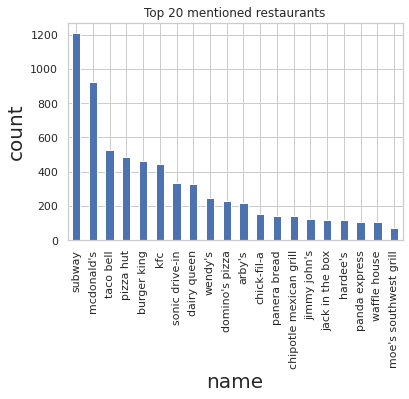

In [ ]:
# top 20 restaurants recorded by count total
print("Number of unique restaurant:", df['name'].nunique())
nameplot = df['name'].value_counts()[:20].plot.bar(title='Top 20 mentioned restaurants')
nameplot.set_xlabel('name',size=20)
nameplot.set_ylabel('count',size=20)

We can see that Subway, McDonald's, taco bella are the top3 mentioned places to eat fast food

**Lets cluster all the details about address including city country latitude,longitude,province under a single column called detailed address column**

In [ ]:
# address, city, country, lattitude, longitude, name, postal code, province, website
df["detailed_address"] = df["name"] + df["address"]+  df["city"] + df["country"]+ df["latitude"].astype(str) + df["longitude"].astype(str)+ df["postalCode"] +["province"]


# Required DF

In [ ]:
df1 = df[["detailed_address","categories"]]

In [ ]:
#df['categories'] = df['categories'].apply(lambda x: x.split(', '))
df1.head()

,detailed_address,categories
0,carl's jr.2555 11th AvenueGreeleyUS40.39629-10...,"Fast Food Restaurants,Hamburgers and Hot Dogs,..."
1,del taco2513 Highway 6 And 50Grand JunctionUS3...,"Restaurant,Mexican Restaurants,Fast Food Resta..."
2,which wich1125 Patterson RoadGrand JunctionUS3...,"Sandwich Shops,Fast Food Restaurants,Restauran..."
3,chipotle mexican grill3455 N Salida CourtAuror...,"Fast Food Restaurants,Mexican Restaurants,Rest..."
4,taco bell5225 E Colfax AvenueDenverUS39.74044-...,"Fast Food Restaurants,Mexican Restaurants,Rest..."


In [ ]:
df1["categories"] = df1["categories"].map(lambda x: x.lower())
df1.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,detailed_address,categories
0,carl's jr.2555 11th AvenueGreeleyUS40.39629-10...,"fast food restaurants,hamburgers and hot dogs,..."
1,del taco2513 Highway 6 And 50Grand JunctionUS3...,"restaurant,mexican restaurants,fast food resta..."
2,which wich1125 Patterson RoadGrand JunctionUS3...,"sandwich shops,fast food restaurants,restauran..."
3,chipotle mexican grill3455 N Salida CourtAuror...,"fast food restaurants,mexican restaurants,rest..."
4,taco bell5225 E Colfax AvenueDenverUS39.74044-...,"fast food restaurants,mexican restaurants,rest..."


# **Preprocessing**

In [ ]:
def decontract(sentence):
    # specific
    sentence = re.sub(r"won't", "will not", sentence)
    sentence = re.sub(r"can\'t", "can not", sentence)

    # general
    sentence = re.sub(r"n\'t", " not", sentence)
    sentence = re.sub(r"\'re", " are", sentence)
    sentence = re.sub(r"\'s", " is", sentence)
    sentence = re.sub(r"\'d", " would", sentence)
    sentence = re.sub(r"\'ll", " will", sentence)
    sentence = re.sub(r"\'t", " not", sentence)
    sentence = re.sub(r"\'ve", " have", sentence)
    sentence = re.sub(r"\'m", " am", sentence)
    return sentence

def cleanPunc(sentence): 
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    cleaned = cleaned.strip()
    cleaned = cleaned.replace("\n"," ")
    return cleaned

def keepAlpha(sentence):
    alpha_sent = ""
    for word in sentence.split():
        alpha_word = re.sub('[^a-z A-Z]+', '', word)
        alpha_sent += alpha_word
        alpha_sent += " "
    alpha_sent = alpha_sent.strip()
    return alpha_sent

def removeStopWords(sentence):
    global re_stop_words
    return re_stop_words.sub("", sentence)

In [ ]:
stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

re_stop_words = re.compile(r"\b(" + "|".join(stopwords) + ")\\W", re.I)

In [ ]:
stemmer = SnowballStemmer("english")
def stemming(sentence):
    stemSentence = ""
    for word in sentence.split():
        stem = stemmer.stem(word)
        stemSentence += stem
        stemSentence += " "
    stemSentence = stemSentence.strip()
    return stemSentence

In [ ]:
df1['detailed_address'] = df1['detailed_address'].str.lower()
df1['detailed_address'] = df1['detailed_address'].apply(decontract)
df1['detailed_address'] = df1['detailed_address'].apply(cleanPunc)
df1['detailed_address'] = df1['detailed_address'].apply(keepAlpha)
df1['detailed_address'] = df1['detailed_address'].apply(removeStopWords)
df1['detailed_address'] = df1['detailed_address'].apply(stemming)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i,'',input_txt)
    return input_txt

**lets remove the unwanted data or the redundant cloud first we have converted it to lower case so all words will be in lower case.then we will remove the words by checking same pattern**

In [ ]:
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'restaurants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'carry-out food')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'karaoke')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'take out')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'caterers')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'family style restaurants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'delicatessens')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'restaurant')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'home delivery beer and beverages')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'delivery service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'sports bar')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'family style')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'place')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], '&')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], "women's clothing")
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'bars')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'southwestern')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'joint')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'hotel and motel reservations')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'banquet halls & reception facilities')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'delis')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'service stations')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'stands')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'fraternal organizations')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'tourism')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'shops')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'cocktail lounges')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'cypress station')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'family friendly')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'convenience stores')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'bar and grills')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'food delivery')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'manufacturers')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'clubs')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'pubs')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'takeout')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'airport')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'full service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'devonshire')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'youngstown')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'yuma')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'shops')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'restaurant delivery service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'southwestern restaurants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'ale')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'ale-wholesale')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'distributors')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american canoga park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'barbecued poultry')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'frozen desserts')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wine')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'shop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'stores')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'catering')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], '')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wilmington')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'willard ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' -retail')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' -wholes')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' -')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wi-fi hotspots')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'caterer')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'spare rib ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  cape fear')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  downtown beaverton')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  downtown blacksburg')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  colonial avenue area')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes importers')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes seafood')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes locks  locksmiths')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'wholes')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' american  canoga park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' beach')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' downtown blacksburg')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' downtown charleston')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' highland lakes center')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' idlewild south')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' cumberland')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' fishhawk')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'],  ' caf arden - arcade')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' caf hancock')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' caf mission bay')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' caf northeast raleigh')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'],  ' chapels')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' chinese  crossroads area')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' cocktail bar')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' coffee shop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' consultants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' deli / bodega')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' delicatessens')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' dessert shop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' equipment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' dog run')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' equipment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' equipment supplies')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' etc.')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' facilities')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' downtown blacksburg')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'downtown charleston')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' southeast oklahoma city')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' washington park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' food court')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' food tioga - nicetown')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' freezers refrigerating equipment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' village west')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' industrial medical gas' )
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' inglewood')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' preston park')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' lounge')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' management consultants')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' menus')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' merchandise supplies')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'south ames business')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' mgmt.')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' nc')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' office')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' referral services  guides')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' sales service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' salon / barbershop')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'airpark ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'central newport news ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'central westminster')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'eastland')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'easton commons ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'northwest oklahoma city ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'swann estates ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'tulsa hills ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'university ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'vcu')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'west arlington ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'boca del mar ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'central college ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'colonial avenue area ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'coral way ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'downtown blacksburg ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'east columbus ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'financial district ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'first hill ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'glen echo ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], "kamm's corners ")
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'northeast boca raton ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'northgate ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'pearl ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'sherwood - tualatin south ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'short north ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'university ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], ' video tapes-whol. mfrs.')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'aa bowls')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'abbeville')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'abingdon ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'accounting bookkeeping')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'acne treatment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'air cargo package express service')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'air fresheners')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'albuquerque ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alteration tailoring supplies')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alterations tailoring')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alternative complementary medicine')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'alternative complementary medicine physicians')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'american express')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'amusement parks places')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'amusement places  arcades')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'angier ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'anniston ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'anti aging products')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'arcade ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'architectural buildings')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'arts entertainment')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'crosswoods ')
df1['categories'] = np.vectorize(remove_pattern)(df1['categories'], 'sherwood - tualatin north')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
df1['categories'] = [col.replace(' and', ',') for col in df1['categories']]
df1['categories'] = [col.replace('sandwiches', 'sandwich') for col in df1['categories']]
df1['categories'] = [col.replace('hamburgers', 'hamburger') for col in df1['categories']]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
df1['categories'].iloc[::]

0                         fast food ,hamburger, hot dogs,
1                                   ,mexican ,fast food ,
2                                 sandwich ,fast food ,, 
3                                  fast food ,mexican ,, 
4                                    fast food ,mexican ,
                              ...                        
9995    american ,,soul food ,fast food , ,breakfast b...
9996    mexican ,,,irish ,fast food , ,,,american ,,ha...
9997    ,hot dog ,fast food ,american ,hamburger ,gour...
9998        ,, ,american , ,fast food ,,, ,,pizza,,pizza 
9999                                          fast food ,
Name: categories, Length: 10000, dtype: object

# **converting all the categories into the dummy columns**

In [ ]:
new_df = pd.concat([df1.drop('categories', 1), df1['categories'].str.get_dummies(sep=",")], 1)
print(new_df)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  """Entry point for launching an IPython kernel.


                                       detailed_address            fast food  \
0                    carl jr th avenuegreeleyus provinc  0   0             0   
1             del taco highway grand junctionus provinc  0   0             0   
2           wich patterson roadgrand junctionus provinc  1   0             0   
3     chipotl mexican grill n salida courtauroraus p...  1   0             0   
4             taco bell e colfax avenuedenverus provinc  0   0             0   
...                                                 ... ..  ..           ...   
9995  church chicken birmingham carolina avebessemer...  1   0             0   
9996      luxuri box cantilev way ste raleighus provinc  1   0             0   
9997                 mcdonald plover rdploverus provinc  1   0             0   
9998        pizza hut e main sthendersonvilleus provinc  1   0             0   
9999          burger king westgat drivedurhamus provinc  0   0             0   

       american    american     america

In [ ]:
new_df.head()

,detailed_address,,,fast food,american,american,american dundee,american east columbus,american easton,american five points library village,...,weight loss programs,west indian,western,wich,wings,wings,wings,wy\\mexican,yogurt,yogurt
0,carl jr th avenuegreeleyus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,del taco highway grand junctionus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,wich patterson roadgrand junctionus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,chipotl mexican grill n salida courtauroraus p...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,taco bell e colfax avenuedenverus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## **lets remove the unwanted columns which dont have any relationships with cuisnes**

In [ ]:
# dropping unwanted variables
new_df1 =new_df.drop([ 'lounge','mediterranean' , 'office' ,'australian','auto leasing','auto renting','auto repairing','automated teller machines (atm)',
                      'autos','baby gear','baby products','bagels','bagels','bakeries',"bakers' supplies",'bakery','bakery' ,'bar supplies','barbecue grills supplies',
                      'bartending service','bath products','beauty salons','bedding','beverage','beverages','beverages retail','big box store',
                      'billiard parlors', 'biosil', 'bistro','bistro', 'bistros', 'bliss',
                      'bowling','box lunches','braun', 'brewers','brunch' ,'buffet' 
                      ,'buffet'  ,'building contractors','business development','business schools','business services','cabinets',
                      'cable internet','cable tv','caf','caf diplomat','cafes', 'cafeterias','carnivals','carpenters',
                      'carry out','casino', 'chain','cheap eats',
                      'check cashing service','child care',"children's clothing",'clarisonic','clothing',
                      'clothing alterations','cocktail bar','coffee brewing devices','coffee makers','coffee retail','coffee tea','coffeehouses',
                      'collectibles','college academic building','college quad','commercial photographers','commercial printing',
                      'commercial refrigerators','communications','computer internet services','computer online services','concessionaires','construction storage',
                      'consumer electronics','copy centers','cosmetics','craft supplies', 
                      'crestview acres','crosstown plaza', 
                      'dayton','dayton','delivery','deordorant','delicatessen','delicatessen', 'dialysis','dialysis clinics','diesel fuel','discover',
                      'doctor','dog run','dvd','e commerce','e-commerce', 'eating','educational materials',
                      'educational service-business','electric contractors','electronic publishing','employment opportunities',
                      'engravers','essential oils','ethnic food markets','ethnic markets','european','event planners','event planning',
                      'event ticket agencies','exporters','face cleansers' ,'family entertainment','family-friendly dining','farming service',
                      'farms','filipino','financial planning','fish  seafood markets','fish  seafood retail',
                      'fish market','fishing tackle','florists','food  dining','food court','food dining',
                      'food east columbus','food products','food service','food service management','food truck','foods','forever living',
                      'franchising','fund raising games','fur repair','furniture','fusion', 'garden centers','garment services',
                      'gas station','general contractors','general entertainment','geologists','gillette',
                      'gluten-free','gluten-free','global','glue','gluten-free foods','golf courses','golf practice ranges',
                      'green products','grocers-ethnic foods','hair care products','hawaiian', 'headquarters',
                      'health care providers','health clinics','health food store','health medical services','healthy',
                      'historic sites','historic walking areas','holding companies','home furnishings','hospitals','hotel bar',
                      'huntersville','huntersville'], axis=1)

In [ ]:
new_df1

,detailed_address,,,fast food,american,american,american dundee,american east columbus,american easton,american five points library village,...,weight loss programs,west indian,western,wich,wings,wings,wings,wy\\mexican,yogurt,yogurt
0,carl jr th avenuegreeleyus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,del taco highway grand junctionus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,wich patterson roadgrand junctionus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,chipotl mexican grill n salida courtauroraus p...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,taco bell e colfax avenuedenverus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,church chicken birmingham carolina avebessemer...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,luxuri box cantilev way ste raleighus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,mcdonald plover rdploverus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,pizza hut e main sthendersonvilleus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
new_df1["detailed_address"] = new_df1["detailed_address"].astype(str).map(lambda x: x.lower())


In [ ]:
new_df1

,detailed_address,,,fast food,american,american,american dundee,american east columbus,american easton,american five points library village,...,weight loss programs,west indian,western,wich,wings,wings,wings,wy\\mexican,yogurt,yogurt
0,carl jr th avenuegreeleyus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,del taco highway grand junctionus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,wich patterson roadgrand junctionus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,chipotl mexican grill n salida courtauroraus p...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,taco bell e colfax avenuedenverus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,church chicken birmingham carolina avebessemer...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,luxuri box cantilev way ste raleighus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,mcdonald plover rdploverus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,pizza hut e main sthendersonvilleus provinc,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
new_df1=new_df.drop([' '],axis=1)

## **Checking the count of different cusine**

In [ ]:
bar_plot = pd.DataFrame()
bar_plot['cat'] = new_df1.columns[1:]
bar_plot['count'] = new_df1.iloc[:,1:].sum().values
bar_plot.sort_values(['count'], inplace=True, ascending=False)
bar_plot.reset_index(inplace=True, drop=True)
bar_plot.head()

,cat,count
0,fast food,8605
1,american,4187
2,sandwich,2930
3,fast food,2733
4,hamburger,2450


In [ ]:
bar_plot.shape

(1346, 2)

In [ ]:
threshold = 500


In [ ]:
main_categories = pd.DataFrame()
main_categories = bar_plot[bar_plot['count']>50]
categories = main_categories['cat'].values
categories = np.append(categories,'Others')
not_category = []
new_df1['Others'] = 0

for i in new_df1.columns[1:]:
    if i not in categories:
        new_df1['Others'][new_df1[i] == 1] = 1
        not_category.append(i)

new_df1.drop(not_category, axis=1, inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [ ]:
most_common_cat = pd.DataFrame()
most_common_cat['cat'] = new_df1.columns[1:]
most_common_cat['count'] = new_df1.iloc[:,1:].sum().values
most_common_cat.sort_values(['count'], inplace=True, ascending=False)
most_common_cat.reset_index(inplace=True, drop=True)
most_common_cat.head()

,cat,count
0,fast food,8605
1,american,4187
2,sandwich,2930
3,fast food,2733
4,hamburger,2450


In [ ]:
most_common_cat.shape

(92, 2)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


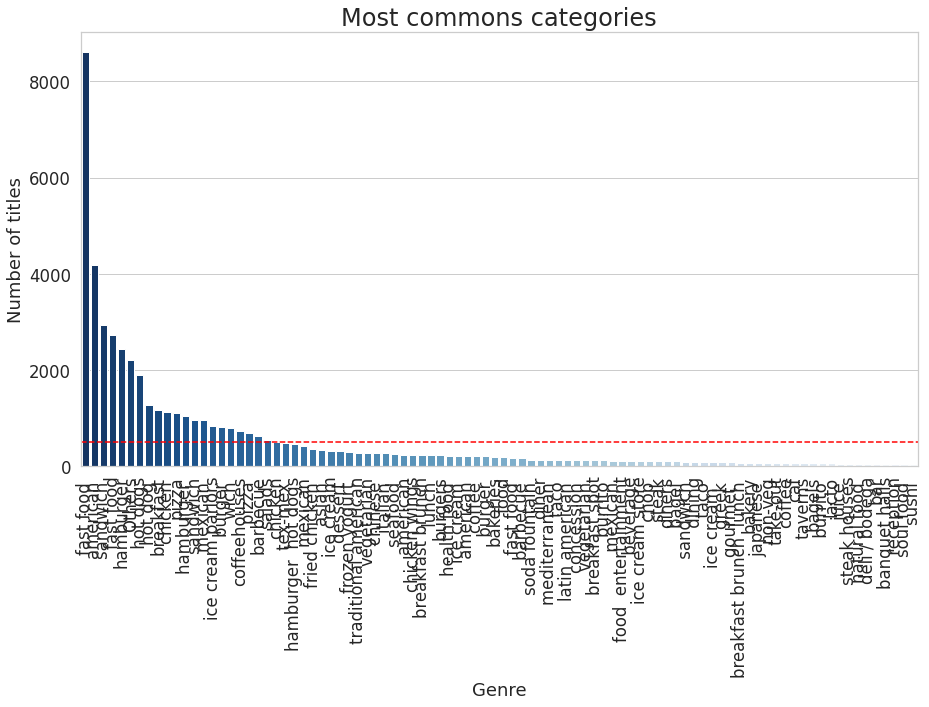

In [ ]:
plt.figure(figsize=(15,8))
sns.set(font_scale = 1.5)
sns.set_style('whitegrid') 


pal = sns.color_palette("Blues_r", len(most_common_cat))
rank = most_common_cat['count'].argsort().argsort()  

sns.barplot(most_common_cat['cat'], most_common_cat['count'], palette=np.array(pal[::-1])[rank])
plt.axhline(threshold, ls='--', c='red')
plt.title("Most commons categories", fontsize=24)
plt.ylabel('Number of titles', fontsize=18)
plt.xlabel('Genre', fontsize=18)
plt.xticks(rotation='vertical')

plt.show()

In [ ]:
new_df1

,detailed_address,american,beverage,burger,burrito,chop,dining,fast food,hot dogs,lunch,...,sushi,taco,take-out,taverns,tex-mex,traditional american,vegetarian,vegetarian,wich,Others
0,carl jr th avenuegreeleyus provinc,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,del taco highway grand junctionus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,wich patterson roadgrand junctionus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,chipotl mexican grill n salida courtauroraus p...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,taco bell e colfax avenuedenverus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,church chicken birmingham carolina avebessemer...,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9996,luxuri box cantilev way ste raleighus provinc,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
9997,mcdonald plover rdploverus provinc,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9998,pizza hut e main sthendersonvilleus provinc,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
rowSums = new_df1.iloc[:,1:].sum(axis=1)
multiLabel_counts = rowSums.value_counts()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


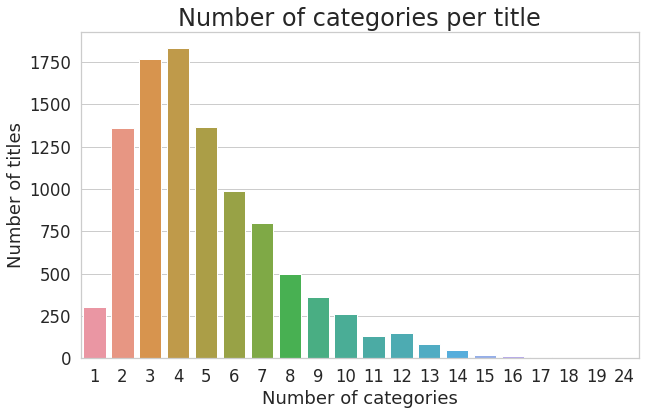

In [ ]:
sns.set(font_scale = 1.5)
sns.set_style('whitegrid') 
plt.figure(figsize=(10,6))

sns.barplot(multiLabel_counts.index, multiLabel_counts.values)
plt.title("Number of categories per title", fontsize=24)
plt.ylabel('Number of titles', fontsize=18)
plt.xlabel('Number of categories', fontsize=18)

plt.show()


In [ ]:
boxplot = new_df1.copy()
boxplot['len'] = new_df1.detailed_address.apply(lambda x: len(x))

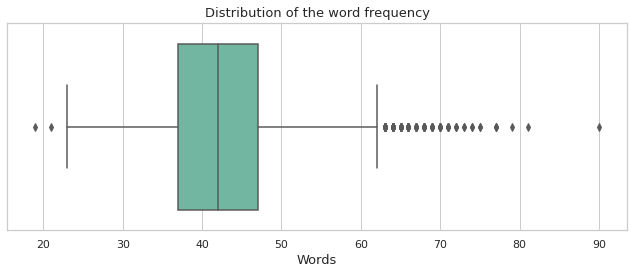

In [ ]:
sns.set(style="whitegrid",rc={"font.size":13,"axes.labelsize":13})

plt.figure(figsize=(9, 4))

ax = sns.boxplot(x='len', data=boxplot, orient="h", palette="Set2")
plt.ylabel('')
plt.xlabel('Words')
plt.title("Distribution of the word frequency", fontsize=13)
plt.tight_layout(h_pad=3)

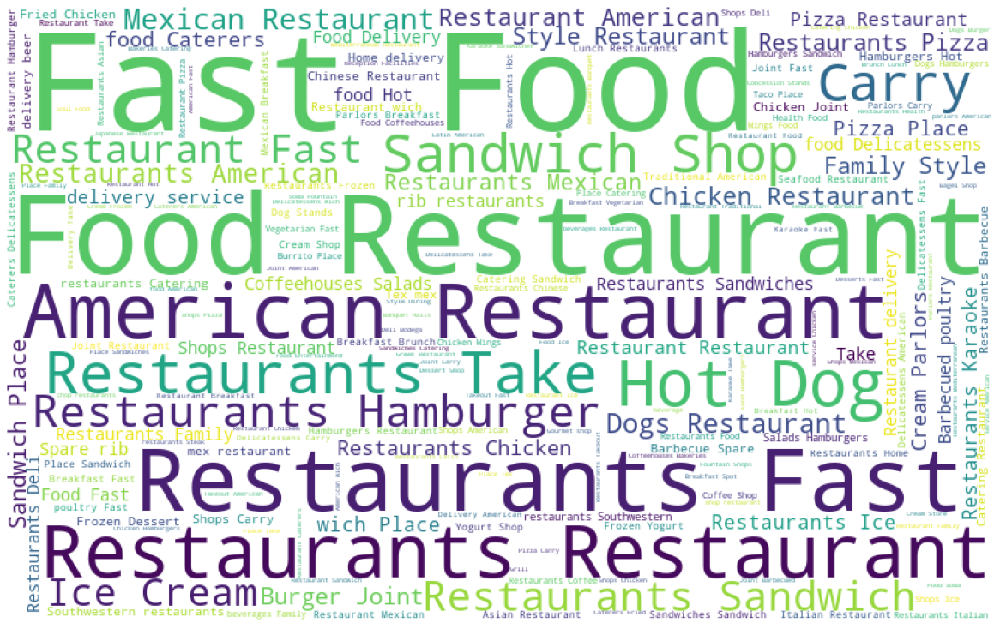

In [ ]:
all_words = ' '.join([text for text in df['categories']]) 
wordcloud = WordCloud(width = 800 , height = 500 , random_state = 42 , background_color ='white',max_font_size = 110 ).generate(all_words)
plt.figure(figsize = (16, 16), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show() 

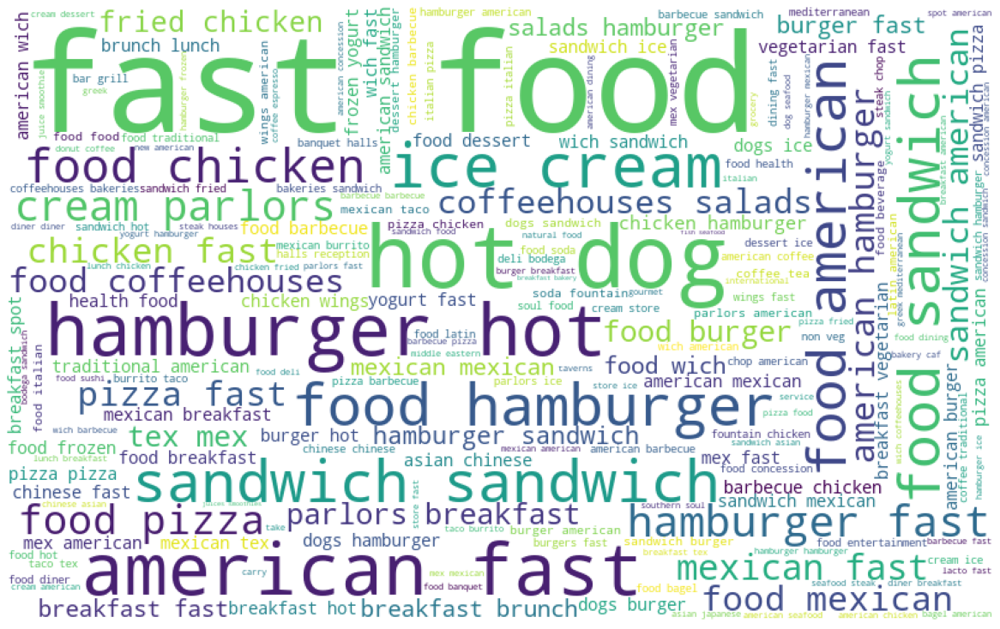

In [ ]:
all_words = ' '.join([text for text in df1['categories']]) 
wordcloud = WordCloud(width = 800 , height = 500 , random_state = 42 , background_color ='white',max_font_size = 110 ).generate(all_words)
plt.figure(figsize = (16, 16), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show() 

# **Multi-Label model Building** 

In [ ]:
columns=['OneVsAll', 'BinaryRelevance', 'ClassifierChain', 'MultipleOutput','DNN', 'CNN', 'LSTM']
results = pd.DataFrame(columns = columns)
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM


In [ ]:
seeds = [1, 43, 678, 90, 135]

In [ ]:
t = results.copy()
t

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(new_df1['detailed_address'], 
                                                    new_df1[new_df1.columns[1:]], 
                                                    test_size=0.3, 
                                                    random_state=seeds[4], 
                                                    shuffle=True)
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(X_train)

X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(7000, 49388) (7000, 92)
(3000, 49388) (3000, 92)


# **Models**

## **OneVsRestClassifier**
As the running time for this model is quite high so i have taken the accuracy score which I got while testing it if you want run it you can remove the comment and check the accuracy scoreBinaryRelevance

In [ ]:
LR_pipeline = Pipeline([('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1))])
accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    LR_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = LR_pipeline.predict(X_test)
    accuracy = accuracy + accuracy_score(y_test[category], prediction)
    print('AUC ROC score is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing  american  titles...**
AUC ROC score is 0.5157590811380885


**Processing  beverage titles...**
AUC ROC score is 0.5


**Processing  burger  titles...**
AUC ROC score is 0.5719942098092643


**Processing  burrito  titles...**
AUC ROC score is 0.6341809634287807


**Processing  chop  titles...**
AUC ROC score is 0.4991579656449983


**Processing  dining titles...**
AUC ROC score is 0.5498316498316499


**Processing  fast food  titles...**
AUC ROC score is 0.5


**Processing  hot dogs titles...**
AUC ROC score is 0.7266790352504637


**Processing  lunch  titles...**
AUC ROC score is 0.5971215219681478


**Processing  mexican  titles...**
AUC ROC score is 0.543637092905286


**Processing  reception titles...**
AUC ROC score is 0.5


**Processing  sandwich  titles...**
AUC ROC score is 0.5358597750121463


**Processing  taco  titles...**
AUC ROC score is 0.6141414141414141


**Processing american titles...**
AUC ROC score is 0.5


**Processing american  titles...**
AUC ROC sco

In [ ]:
from sklearn.naive_bayes import MultinomialNB

NB_pipeline = Pipeline([('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None)))])
accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    NB_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = NB_pipeline.predict(X_test)
    accuracy = accuracy + accuracy_score(y_test[category], prediction)
    print('AUC ROC is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing  american  titles...**
AUC ROC is 0.5


**Processing  beverage titles...**
AUC ROC is 0.5


**Processing  burger  titles...**
AUC ROC is 0.5


**Processing  burrito  titles...**
AUC ROC is 0.5


**Processing  chop  titles...**
AUC ROC is 0.5


**Processing  dining titles...**
AUC ROC is 0.5


**Processing  fast food  titles...**
AUC ROC is 0.5


**Processing  hot dogs titles...**
AUC ROC is 0.5143413729128015


**Processing  lunch  titles...**
AUC ROC is 0.5


**Processing  mexican  titles...**
AUC ROC is 0.5


**Processing  reception titles...**
AUC ROC is 0.5


**Processing  sandwich  titles...**
AUC ROC is 0.5


**Processing  taco  titles...**
AUC ROC is 0.5


**Processing american titles...**
AUC ROC is 0.5


**Processing american  titles...**
AUC ROC is 0.6652660899683722


**Processing asian  titles...**
AUC ROC is 0.5


**Processing bagel  titles...**
AUC ROC is 0.5


**Processing bagels titles...**
AUC ROC is 0.5


**Processing bakeries titles...**
AUC ROC is 0.5



In [ ]:
from sklearn.svm import LinearSVC, SVC
SVC_pipeline = Pipeline([('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1))])

accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    SVC_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = SVC_pipeline.predict(X_test)
    accuracy = accuracy + roc_auc_score(y_test[category], prediction)
    print('F1-score is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged f1-score is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing  american  titles...**
F1-score is 0.5384626467418554


**Processing  beverage titles...**
F1-score is 0.4991576819407008


**Processing  burger  titles...**
F1-score is 0.5709724114441417


**Processing  burrito  titles...**
F1-score is 0.7008517003480067


**Processing  chop  titles...**
F1-score is 0.5784558719673182


**Processing  dining titles...**
F1-score is 0.7653198653198652


**Processing  fast food  titles...**
F1-score is 0.5218815352441875


**Processing  hot dogs titles...**
F1-score is 0.8163636363636364


**Processing  lunch  titles...**
F1-score is 0.7390159261324906


**Processing  mexican  titles...**
F1-score is 0.5328546373996271


**Processing  reception titles...**
F1-score is 0.5310824396782842


**Processing  sandwich  titles...**
F1-score is 0.5346825129872556


**Processing  taco  titles...**
F1-score is 0.6627946127946127


**Processing american titles...**
F1-score is 0.5226717788316012


**Processing american  titles...**
F1-score is 0.714141

In [ ]:
  from sklearn.ensemble import RandomForestClassifier

RF_pipeline = Pipeline([('clf', OneVsRestClassifier(RandomForestClassifier(), n_jobs=1))])

accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    RF_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = RF_pipeline.predict(X_test)
    accuracy = accuracy + roc_auc_score(y_test[category], prediction)
    print('AUC ROC is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df.columns[1:])))

**Processing  american  titles...**
AUC ROC is 0.5083045660705744


**Processing  beverage titles...**
AUC ROC is 0.49983153638814015


**Processing  burger  titles...**
AUC ROC is 0.5


**Processing  burrito  titles...**
AUC ROC is 0.5225593748092069


**Processing  chop  titles...**
AUC ROC is 0.5949217179673834


**Processing  dining titles...**
AUC ROC is 0.49983164983164985


**Processing  fast food  titles...**
AUC ROC is 0.5


**Processing  hot dogs titles...**
AUC ROC is 0.6268460111317256


**Processing  lunch  titles...**
AUC ROC is 0.5824812542603954


**Processing  mexican  titles...**
AUC ROC is 0.5


**Processing  reception titles...**
AUC ROC is 0.5


**Processing  sandwich  titles...**
AUC ROC is 0.5


**Processing  taco  titles...**
AUC ROC is 0.49983164983164985


**Processing american titles...**
AUC ROC is 0.511593179295732


**Processing american  titles...**
AUC ROC is 0.6690608799587767


**Processing asian  titles...**
AUC ROC is 0.6831710252762885


**Processin

In [ ]:
results.loc[4,'OneVsAll'] = accuracy/len(new_df1.columns[1:])
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.596195,NaN,NaN,NaN,NaN,NaN,NaN


# **BinaryRelevance**
As the running time for this model is quite high so i have taken the accuracy score which I got while testing it if you want run it you can remove the comment and check the accuracy score

In [ ]:
""""from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB

classifier = BinaryRelevance(GaussianNB())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)
accuracy_score(y_test,predictions)
print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))"""

'"from skmultilearn.problem_transform import BinaryRelevance\nfrom sklearn.naive_bayes import GaussianNB\n\nclassifier = BinaryRelevance(GaussianNB())\nclassifier.fit(X_train, y_train)\npredictions = classifier.predict(X_test)\naccuracy_score(y_test,predictions)\nprint(\'AUC ROC is {}\'.format(roc_auc_score(y_test,predictions.toarray())))'

In [ ]:
""""results.loc[4,'BinaryRelevance'] = roc_auc_score(y_test,predictions.toarray())
results"""

'"results.loc[4,\'BinaryRelevance\'] = roc_auc_score(y_test,predictions.toarray())\nresults'

# **ClassifierChain**
As the running time for this model is quite high so i have taken the accuracy score which I got while testing it if you want run it you can remove the comment and check the accuracy score

In [ ]:
""""from skmultilearn.problem_transform import ClassifierChain
from sklearn.linear_model import LogisticRegression

classifier = ClassifierChain(LogisticRegression())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)

print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))"""

'"from skmultilearn.problem_transform import ClassifierChain\nfrom sklearn.linear_model import LogisticRegression\n\nclassifier = ClassifierChain(LogisticRegression())\nclassifier.fit(X_train, y_train)\npredictions = classifier.predict(X_test)\n\nprint(\'AUC ROC is {}\'.format(roc_auc_score(y_test,predictions.toarray())))'

In [ ]:
""""results.loc[4,'ClassifierChain'] = roc_auc_score(y_test,predictions.toarray())
results"""

'"results.loc[4,\'ClassifierChain\'] = roc_auc_score(y_test,predictions.toarray())\nresults'

# **MultiOutputClassifier**
As the running time for this model is quite high so i have taken the accuracy score which I got while testing it if you want run it you can remove the comment and check the accuracy score

In [ ]:
clf = MultiOutputClassifier(KNeighborsClassifier()).fit(X_train, y_train)
predictions = clf.predict(X_test)

print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions)))

AUC ROC is 0.6169620207584563


In [ ]:
results.loc[4,'MultipleOutput'] = roc_auc_score(y_test,predictions)
results


,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.596195,NaN,NaN,0.616962,NaN,NaN,NaN


# **Deep Learning**

## **Word Embedding**

In [ ]:
new_df1['detailed_address']

0                      carl jr th avenuegreeleyus provinc
1               del taco highway grand junctionus provinc
2             wich patterson roadgrand junctionus provinc
3       chipotl mexican grill n salida courtauroraus p...
4               taco bell e colfax avenuedenverus provinc
                              ...                        
9995    church chicken birmingham carolina avebessemer...
9996        luxuri box cantilev way ste raleighus provinc
9997                   mcdonald plover rdploverus provinc
9998          pizza hut e main sthendersonvilleus provinc
9999            burger king westgat drivedurhamus provinc
Name: detailed_address, Length: 10000, dtype: object

In [ ]:
df2 = new_df1

In [ ]:
tokenizer = Tokenizer(num_words=5000, lower=True)
tokenizer.fit_on_texts(df2['detailed_address'])
sequences = tokenizer.texts_to_sequences(df2['detailed_address'])
x = pad_sequences(sequences, maxlen=200)
y = pad_sequences(sequences, maxlen=200)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, 
                                                    df2[df2.columns[1:]], 
                                                    test_size=0.3, 
                                                    random_state=seeds[4])

In [ ]:
most_common_cat['class_weight'] = len(most_common_cat) / most_common_cat['count']
class_weight = {}
for index, label in enumerate(categories):
    class_weight[index] = most_common_cat[most_common_cat['cat'] == categories]['class_weight'].values[0]
    
most_common_cat.head()

,cat,count,class_weight
0,fast food,8605,0.010691
1,american,4187,0.021973
2,sandwich,2930,0.031399
3,fast food,2733,0.033663
4,hamburger,2450,0.037551


In [ ]:
num_classes = y_train.shape[1]
max_words = len(tokenizer.word_index) + 1
maxlen = 200

In [ ]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

# **DNN**

In [ ]:
model = Sequential()
model.add(Embedding(max_words, 20, input_length=maxlen))
#model.add(Dropout(0.2))
model.add(GlobalMaxPool1D())
model.add(Dense(num_classes, activation='sigmoid'))

model.compile(optimizer=Adam(0.015), loss='binary_crossentropy', metrics=[tf.keras.metrics.AUC()])
callbacks = [
    ReduceLROnPlateau(),
    #EarlyStopping(patience=10),
    ModelCheckpoint(filepath='model-simple.h5', save_best_only=True)
]


history = model.fit(X_train, y_train,
                    class_weight=class_weight,
                    epochs=30,
                    batch_size=32,
                    validation_split=0.3,
                    callbacks=callbacks)


Epoch 1/30
154/154 [==============================] - 3s 12ms/step - loss: 0.0021 - auc: 0.7920 - val_loss: 0.1397 - val_auc: 0.8806 - lr: 0.0150
Epoch 2/30
154/154 [==============================] - 1s 9ms/step - loss: 0.0013 - auc: 0.9195 - val_loss: 0.1094 - val_auc: 0.9405 - lr: 0.0150
Epoch 3/30
154/154 [==============================] - 1s 8ms/step - loss: 0.0011 - auc: 0.9527 - val_loss: 0.1006 - val_auc: 0.9536 - lr: 0.0150
Epoch 4/30
154/154 [==============================] - 2s 10ms/step - loss: 9.7221e-04 - auc: 0.9639 - val_loss: 0.0972 - val_auc: 0.9569 - lr: 0.0150
Epoch 5/30
154/154 [==============================] - 2s 10ms/step - loss: 9.1733e-04 - auc: 0.9684 - val_loss: 0.0968 - val_auc: 0.9571 - lr: 0.0150
Epoch 6/30
154/154 [==============================] - 1s 9ms/step - loss: 8.8857e-04 - auc: 0.9704 - val_loss: 0.0972 - val_auc: 0.9566 - lr: 0.0150
Epoch 7/30
154/154 [==============================] - 1s 9ms/step - loss: 8.6753e-04 - auc: 0.9717 - val_loss: 0.09

In [ ]:
dnn_model = model
metrics = dnn_model.evaluate(X_test, y_test)
print("{}: {}".format(dnn_model.metrics_names[1], metrics[1]))

94/94 [==============================] - 0s 2ms/step - loss: 0.0994 - auc: 0.9522
auc: 0.9522420763969421


In [ ]:
results.loc[4,'BinaryRelevance'] = 0.5807
results.loc[4,'ClassifierChain'] = 0.5853

results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.596195,0.5807,0.5853,0.616962,NaN,NaN,NaN


In [ ]:
results.loc[4,'DNN'] = metrics[1]
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.596195,0.5807,0.5853,0.616962,0.952242,NaN,NaN


## **CNN**

In [ ]:
filter_length = 300

model = Sequential()
model.add(Embedding(max_words, 20, input_length=maxlen))
#model.add(Dropout(0.5))
model.add(Conv1D(filter_length, 3, padding='valid', activation='relu', strides=1))
model.add(GlobalMaxPool1D())
model.add(Dense(num_classes))
model.add(Activation('sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[tf.keras.metrics.AUC()])

callbacks = [
    ReduceLROnPlateau(),
    ModelCheckpoint(filepath='model-conv1d.h5', save_best_only=True)
]

history = model.fit(X_train, y_train,
                    class_weight=class_weight,
                    epochs=30,
                    batch_size=32,
                    validation_split=0.3,
                    callbacks=callbacks)

Epoch 1/30
154/154 [==============================] - 8s 48ms/step - loss: 0.0032 - auc_1: 0.7060 - val_loss: 0.1512 - val_auc_1: 0.8583 - lr: 0.0010
Epoch 2/30
154/154 [==============================] - 7s 45ms/step - loss: 0.0015 - auc_1: 0.8713 - val_loss: 0.1309 - val_auc_1: 0.8983 - lr: 0.0010
Epoch 3/30
154/154 [==============================] - 7s 46ms/step - loss: 0.0013 - auc_1: 0.9238 - val_loss: 0.1094 - val_auc_1: 0.9399 - lr: 0.0010
Epoch 4/30
154/154 [==============================] - 7s 46ms/step - loss: 0.0011 - auc_1: 0.9540 - val_loss: 0.0977 - val_auc_1: 0.9563 - lr: 0.0010
Epoch 5/30
154/154 [==============================] - 7s 45ms/step - loss: 9.7002e-04 - auc_1: 0.9644 - val_loss: 0.0929 - val_auc_1: 0.9614 - lr: 0.0010
Epoch 6/30
154/154 [==============================] - 7s 46ms/step - loss: 9.0859e-04 - auc_1: 0.9696 - val_loss: 0.0900 - val_auc_1: 0.9628 - lr: 0.0010
Epoch 7/30
154/154 [==============================] - 7s 46ms/step - loss: 8.5793e-04 - auc_

In [ ]:
cnn_model = model
metrics = cnn_model.evaluate(X_test, y_test)
print("{}: {}".format(model.metrics_names[1], metrics[1]))

94/94 [==============================] - 1s 12ms/step - loss: 0.0989 - auc_1: 0.9529
auc_1: 0.9529055953025818


In [ ]:
results.loc[4,'CNN'] = metrics[1]
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.596195,0.5807,0.5853,0.616962,0.952242,0.952906,NaN


## **GloVe - LSTM**

In [ ]:
embeddings_dictionary = dict()

glove_file = open('/content/drive/MyDrive/glove.6B.100d.txt', encoding="utf8")

for line in glove_file:
    records = line.split()
    word = records[0]
    vector_dimensions = asarray(records[1:], dtype='float32')
    embeddings_dictionary[word] = vector_dimensions
glove_file.close()

embedding_matrix = zeros((max_words, 100))
for word, index in tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

In [ ]:
from keras.layers import Input
deep_inputs = Input(shape=(maxlen,))
embedding_layer = Embedding(max_words, 100, weights=[embedding_matrix], trainable=False)(deep_inputs)
LSTM_Layer_1 = LSTM(128)(embedding_layer)
dense_layer_1 = Dense(92, activation='sigmoid')(LSTM_Layer_1)
model = Model(inputs=deep_inputs, outputs=dense_layer_1)

callbacks = [
    ReduceLROnPlateau(),
    ModelCheckpoint(filepath='model-conv1d.h5', save_best_only=True)
]

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=[tf.keras.metrics.AUC()])
history = model.fit(X_train, y_train.values,
                    class_weight=class_weight,
                    batch_size=32, 
                    epochs=30, 
                    validation_split=0.3,
                    callbacks=callbacks)

Epoch 1/30
154/154 [==============================] - 43s 242ms/step - loss: 0.0024 - auc_3: 0.7693 - val_loss: 0.1524 - val_auc_3: 0.8526 - lr: 0.0010
Epoch 2/30
154/154 [==============================] - 36s 235ms/step - loss: 0.0016 - auc_3: 0.8511 - val_loss: 0.1527 - val_auc_3: 0.8520 - lr: 0.0010
Epoch 3/30
154/154 [==============================] - 36s 234ms/step - loss: 0.0016 - auc_3: 0.8524 - val_loss: 0.1519 - val_auc_3: 0.8548 - lr: 0.0010
Epoch 4/30
154/154 [==============================] - 36s 235ms/step - loss: 0.0016 - auc_3: 0.8571 - val_loss: 0.1475 - val_auc_3: 0.8654 - lr: 0.0010
Epoch 5/30
154/154 [==============================] - 39s 256ms/step - loss: 0.0015 - auc_3: 0.8769 - val_loss: 0.1379 - val_auc_3: 0.8865 - lr: 0.0010
Epoch 6/30
154/154 [==============================] - 36s 233ms/step - loss: 0.0014 - auc_3: 0.8982 - val_loss: 0.1292 - val_auc_3: 0.9061 - lr: 0.0010
Epoch 7/30
154/154 [==============================] - 36s 237ms/step - loss: 0.0013 - au

In [ ]:
metrics = model.evaluate(X_test, y_test)
print("{}: {}".format(model.metrics_names[1], metrics[1]))

94/94 [==============================] - 6s 64ms/step - loss: 0.0980 - auc_3: 0.9550
auc_3: 0.9550361037254333


In [ ]:
results.loc[4,'LSTM'] = metrics[1]
results

## **Results**

In [ ]:
def highlight_max(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_max = data == data.max()
        return [attr if v else '' for v in is_max]
    else:  # from .apply(axis=None)
        is_max = data == data.max().max()
        return pd.DataFrame(np.where(is_max, attr, ''),
                            index=data.index, columns=data.columns)

In [ ]:
def highlight_min(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_min = data == data.min()
        return [attr if v else '' for v in is_min]
    else:  # from .apply(axis=None)
        is_min = data == data.min().min()
        return pd.DataFrame(np.where(is_min, attr, ''),
                            index=data.index, columns=data.columns)

In [ ]:
results.style.apply(highlight_min, color='red', axis=None).apply(highlight_max, color='lightgreen', axis=None)

In [ ]:
#cm = sns.light_palette("green", as_cmap=True)
cm = LinearSegmentedColormap.from_list(
    name='test', 
    #colors=['red','white','green','white','red']
    colors=['tomato','orange','white','lightgreen','green']
)

t = results.apply(pd.to_numeric).style.background_gradient(cmap=cm)
t

In [ ]:
def background_gradient(s, m=None, M=None, cmap=cm, low=0, high=0):
    if m is None:
        m = s.min().min()
    if M is None:
        M = s.max().max()
    rng = M - m
    norm = colors.Normalize(m ,M)
    normed = s.apply(lambda x: norm(x.values))
    cm = plt.cm.get_cmap(cmap)
    c = normed.applymap(lambda x: colors.rgb2hex(cm(x)))
    ret = c.applymap(lambda x: 'background-color: %s' % x)
    return ret

In [ ]:
results.style.apply(background_gradient, axis=None)